## Import TensorFlow and other libraries

In [1]:
import matplotlib.pyplot as plt
import math
import numpy as np
import pandas as pd
import tensorflow as tf
from random import randrange
from PIL import Image
import random
import matplotlib.animation as animation
import matplotlib.image as mpimg

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model
from tensorflow.keras import activations
from tensorflow.keras import initializers
import os
from scipy.interpolate import CubicSpline

2023-09-11 14:55:52.222801: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [2]:
from matplotlib.animation import FuncAnimation
from IPython import display
import keras_tuner as kt
from tensorflow.keras import backend as K
import matplotlib.animation as animation

In [3]:
from tensorflow.keras import regularizers
from tensorflow.keras import optimizers
tf.config.set_visible_devices([], 'GPU')

2023-09-11 14:55:57.303231: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-09-11 14:55:57.305086: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-09-11 14:55:57.352384: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:9e:00.0 name: Quadro P400 computeCapability: 6.1
coreClock: 1.2525GHz coreCount: 2 deviceMemorySize: 1.94GiB deviceMemoryBandwidth: 29.88GiB/s
2023-09-11 14:55:57.352431: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-09-11 14:55:57.419698: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-09-11 14:55:57.419897: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.10
2023-09-11 

## Load the dataset
To start, you will train the basic autoencoder using the Fashion MNIST dataset. Each image in this dataset is 28x28 pixels. 

In [4]:
#Fonction qui transforme un nombre en string écrit en 4 chiffres pour lire les noms des fichiers
#Exemple 1 -> '0001'  
def format_number(num, digits):
    return str(num).zfill(digits)

In [5]:
#Generation de la base de données et concaténation.
#ATTENTION dans mon fichier d'image l'intensité 0 commence à 1000 au lieu de 0 d'où le if
nom_fichier="hydro"
n=1000
size=128
Bdd_train=[]
prediction_train=[]

Bdd_test=[]
prediction_test=[]
k=0
Nombre_images_voulues=5000
Nombre_fichiers=int(n/57)
indice_train=int(Nombre_fichiers*0.8)
indice_test=n


for i in range(0,3):
    folder=i
    if i==0:
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1003,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1004,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Bdd_train.append(np.concatenate((image1,image2),axis=1))
        
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1004,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)

        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1005,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Bdd_train.append(np.concatenate((image1,image2),axis=1))
        
        for j in range(1005,2001):
            image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j,4)+".gif").convert('RGB')
            image1=image1.resize((128,128),Image.ANTIALIAS)
            image1=np.array(image1)
            image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j+1,4)+".gif").convert('RGB')
            image2=image2.resize((128,128),Image.ANTIALIAS)
            image2=np.array(image2)
            Bdd_train.append(np.concatenate((image1,image2),axis=1))
            prediction_train.append(Bdd_train[len(Bdd_train)-1])
            
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2001,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2002,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        prediction_train.append(np.concatenate((image1,image2),axis=1))   
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2002,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2003,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        prediction_train.append(np.concatenate((image1,image2),axis=1))

    else:
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Bdd_train.append(np.concatenate((image1,image2),axis=1))
        
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)

        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(3,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Bdd_train.append(np.concatenate((image1,image2),axis=1))
        
        for j in range(3,999):
            image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j,4)+".gif").convert('RGB')
            image1=image1.resize((128,128),Image.ANTIALIAS)
            image1=np.array(image1)
            image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j+1,4)+".gif").convert('RGB')
            image2=image2.resize((128,128),Image.ANTIALIAS)
            image2=np.array(image2)
            Bdd_train.append(np.concatenate((image1,image2),axis=1))
            prediction_train.append(Bdd_train[len(Bdd_train)-1])
            
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(999,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1000,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        prediction_train.append(np.concatenate((image1,image2),axis=1))   
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1000,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1001,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        prediction_train.append(np.concatenate((image1,image2),axis=1))

print("train fait")
  
k=0





/tmp/ipykernel_39016/649780377.py:22: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image1=image1.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_39016/649780377.py:25: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image2=image2.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_39016/649780377.py:30: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image1=image1.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_39016/649780377.py:34: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image2=image2.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_39016/649780377.py:40: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 

train fait


In [6]:
Bdd_train=np.array(Bdd_train)

prediction_train=np.array(prediction_train)


In [7]:
Bdd_train=Bdd_train / 255
prediction_train=prediction_train / 255

In [8]:
Bdd_train, Bdd_test,prediction_train, prediction_test = train_test_split(Bdd_train,prediction_train ,
                                   random_state=104, 
                                   test_size=0.2, 
                                   shuffle=True)

## Encoder Decoder



Définition de fonction pour créer le modèle (papier)

In [9]:
def deconv_sigmoid(outch,kernel_size,stride=1,padding='same'):
    convlayer = tf.keras.Sequential([
        tf.keras.layers.Conv2DTranspose(outch, kernel_size=kernel_size,  activation='sigmoid', padding='same',strides=stride),
    
    ])
    return convlayer

def deconv_relu(outch,kernel_size,stride=1,padding=1):
    convlayer = tf.keras.Sequential([
        tf.keras.layers.Conv2DTranspose(outch, kernel_size=kernel_size,  padding='same',strides=stride),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),

    ])
    return convlayer



In [10]:


#CONSTRUCTION DU MODELE DE DÉCODAGE
deconv_8 = deconv_relu(64,(3,4),stride=(1,2))
deconv_7 = deconv_relu(32,4,stride=2)
deconv_6 = deconv_relu(16,4,stride=2)
deconv_5 = deconv_relu(8,4,stride=2)
deconv_4 = deconv_relu(8,4,stride=2)
deconv_3 = deconv_relu(4,4,stride=2)
deconv_2 = deconv_relu(4,4,stride=2)
deconv_1 = deconv_sigmoid(3,4,stride=2)

predict_8 = tf.keras.layers.Conv2D(3,3,strides=1,padding='same')
predict_7 = tf.keras.layers.Conv2D(3,3,strides=1,padding='same')
predict_6 = tf.keras.layers.Conv2D(3,3,strides=1,padding='same')
predict_5 = tf.keras.layers.Conv2D(3,3,strides=1,padding='same')
predict_4 = tf.keras.layers.Conv2D(3,3,strides=1,padding='same')
predict_3 = tf.keras.layers.Conv2D(3,3,strides=1,padding='same')
predict_2 = tf.keras.layers.Conv2D(3,3,strides=1,padding='same')

up_sample_8 = tf.keras.Sequential([      
    tf.keras.layers.Conv2DTranspose(3, kernel_size=(3, 4), activation='sigmoid', padding='same',strides=(1,2),use_bias=False),         
    ])

up_sample_7 =tf.keras.Sequential([     
    tf.keras.layers.Conv2DTranspose(3, kernel_size=(4, 4), activation='sigmoid', padding='same',strides=2,use_bias=False),
    ])

up_sample_6 = tf.keras.Sequential([           
    tf.keras.layers.Conv2DTranspose(3, kernel_size=(4, 4), activation='sigmoid', padding='same',strides=2,use_bias=False),
     ])

up_sample_5 = tf.keras.Sequential([           
    tf.keras.layers.Conv2DTranspose(3, kernel_size=(4, 4), activation='sigmoid', padding='same',strides=2,use_bias=False),
     ])

up_sample_4 = tf.keras.Sequential([        
    tf.keras.layers.Conv2DTranspose(3, kernel_size=(4, 4), activation='sigmoid', padding='same',strides=2,use_bias=False),
    ])

up_sample_3 = tf.keras.Sequential([         
    tf.keras.layers.Conv2DTranspose(3, kernel_size=(4, 4), activation='sigmoid', padding='same',strides=2,use_bias=False),
     ])

up_sample_2 = tf.keras.Sequential([     
    tf.keras.layers.Conv2DTranspose(3, kernel_size=(4, 4), activation='sigmoid', padding='same',strides=2,use_bias=False),
     ])



def minigooglenet_functional(width, height, depth, classes):
    inputShape=(height,width,depth)
    chanDim=-1
    inputs=tf.keras.layers.Input(shape=inputShape)

    deconv8_out = deconv_8(inputs)
    predict_8_out = up_sample_8(predict_8(inputs))
    x = tf.keras.layers.Concatenate(axis=3)([deconv8_out, predict_8_out])

    deconv7_out = deconv_7(x)
    predict_7_out = up_sample_7(predict_7(x))
    x = tf.keras.layers.Concatenate(axis=3)([deconv7_out, predict_7_out])


    deconv6_out = deconv_6(x)
    predict_6_out = up_sample_6(predict_6(x))
    x = tf.keras.layers.Concatenate(axis=3)([deconv6_out, predict_6_out])

    deconv5_out = deconv_5(x)
    predict_5_out = up_sample_5(predict_5(x))
    x = tf.keras.layers.Concatenate(axis=3)([deconv5_out, predict_5_out])
    
    deconv4_out = deconv_4(x)
    predict_4_out = up_sample_4(predict_4(x))
    x = tf.keras.layers.Concatenate(axis=3)([deconv4_out, predict_4_out])
    
    deconv3_out = deconv_3(x)
    predict_3_out = up_sample_6(predict_3(x))
    x = tf.keras.layers.Concatenate(axis=3)([deconv3_out, predict_3_out])
    
    deconv2_out = deconv_2(x)
    predict_2_out = up_sample_2(predict_2(x))
    x = tf.keras.layers.Concatenate(axis=3)([deconv2_out, predict_2_out]) 
    
    
    x = deconv_1(x)
    


    model=Model(inputs,x,name="Test")
    return model



2023-09-08 11:29:01.038595: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-08 11:29:01.041190: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-09-08 11:29:01.041242: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1261] Device interconnect StreamExecutor with strength 1 edge matrix:
2023-09-08 11:29:01.041250: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1267]      


Modèle (Papier)

In [11]:
latent_dim =64
p_x=128
p_y=128

class Autoencoder(Model):
  def __init__(self, latent_dim):
    super(Autoencoder, self).__init__()
    self.latent_dim = latent_dim   
    self.encoder = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(p_x, 2*p_y, 3)),
        
        tf.keras.layers.Conv2D(4, (4, 4), padding='same', strides=2),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        tf.keras.layers.Conv2D(4, (3, 3), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        
        
        
        tf.keras.layers.Conv2D(4, (4, 4), padding='same', strides=2),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        tf.keras.layers.Conv2D(4, (3, 3), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        
        
        
        tf.keras.layers.Conv2D(4, (4, 4), padding='same', strides=2),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        tf.keras.layers.Conv2D(4, (3, 3), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        
        
        
        tf.keras.layers.Conv2D(8, (4, 4), padding='same', strides=2),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        tf.keras.layers.Conv2D(8, (3, 3), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        
        
        
        tf.keras.layers.Conv2D(8, (4, 4), padding='same', strides=2),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        tf.keras.layers.Conv2D(8, (3, 3), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        
        
        
        tf.keras.layers.Conv2D(16, (4, 4), padding='same', strides=2),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        tf.keras.layers.Conv2D(16, (3, 3), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        
        
        
        tf.keras.layers.Conv2D(32, (4, 4), padding='same', strides=2),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        tf.keras.layers.Conv2D(32, (3, 3), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        
        
         tf.keras.layers.Conv2D(64, (3, 4), padding='same', strides=(1,2)),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),
        tf.keras.layers.Conv2D(64, (3, 3), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation(activations.relu),

    ])
   
    self.decoder = minigooglenet_functional(1, 1, 64, 3)

     
        
        
        
    
    
  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded
  
autoencoder = Autoencoder(latent_dim) 

In [12]:
autoencoder.encoder.summary()
autoencoder.decoder.summary()


Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 64, 128, 4)        196       
_________________________________________________________________
batch_normalization_7 (Batch (None, 64, 128, 4)        16        
_________________________________________________________________
activation_7 (Activation)    (None, 64, 128, 4)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 64, 128, 4)        148       
_________________________________________________________________
batch_normalization_8 (Batch (None, 64, 128, 4)        16        
_________________________________________________________________
activation_8 (Activation)    (None, 64, 128, 4)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 32, 64, 4)       

In [9]:
#echarge le  modèle
autoencoder=tf.keras.models.load_model("../Modele/Hydro_couleur_v2")
#autoencoder=tf.keras.models.load_model("../Modele/Hydro_couleur")

2023-09-11 14:58:14.275555: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-11 14:58:14.278449: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-09-11 14:58:14.278514: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1261] Device interconnect StreamExecutor with strength 1 edge matrix:
2023-09-11 14:58:14.278522: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1267]      
2023-09-11 14:58:17.175322: W tensorflow/core/common_runtime/graph_constructor.cc:809] Node 'activation_24/PartitionedCall' has 1 outputs but the _output_shapes attribute specifies shapes for 2 outputs. Output shapes may be inaccurate.
2023-09-11 14:58:17.

In [42]:
epoch=1000 #epoch pour l'entrainement
epoc=-1 #compteur globale de l'epoc pour le calcul de Error
limite=int(len(Bdd_test)/10)   #Le nombre d'elements de données test dont on va mesure l'erreur
Error=[[0 for i in range(0,limite)] for i in range(0,epoch)] #Tableau d'erreur

#Tentative de définition d'une nouvelle erreur via les CallBack

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.2,
                              patience=5, min_lr=0.001)

train_size=len(Bdd_train)
batch_size=128
initial_learning_rate = 0.001
final_learning_rate = 0.00006
learning_rate_decay_factor = (final_learning_rate / initial_learning_rate)**(1/epoch)
steps_per_epoch = int(train_size/batch_size)

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
                initial_learning_rate=initial_learning_rate,
                decay_steps=steps_per_epoch,
                decay_rate=learning_rate_decay_factor,
                staircase=True)


optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)   
autoencoder.compile(optimizer=optimizer, loss=losses.MeanSquaredError())

#Execution de l'entrainement
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=100)

history=autoencoder.fit(Bdd_train, prediction_train,batch_size=batch_size,
                epochs=epoch,
                shuffle=True,
                validation_data=(Bdd_test, prediction_test), callbacks=[callback],
              )

Epoch 1/1000
19/19 [==============================] - 16s 628ms/step - loss: 8.0315e-04 - val_loss: 5.0185e-04
Epoch 2/1000
19/19 [==============================] - 11s 608ms/step - loss: 4.3376e-04 - val_loss: 3.7604e-04
Epoch 3/1000
 5/19 [======>.......................] - ETA: 7s - loss: 3.4398e-04

KeyboardInterrupt: 

In [25]:
autoencoder.save("../Modele/Hydro_couleur_v2")

2023-07-31 12:24:24.944605: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ../Modele/Hydro_couleur_v2/assets


In [20]:
#Evaluation de la bdd pour retrouver l'erreur
print("Evaluate on test data")
results = autoencoder.evaluate(Bdd_test, prediction_test, batch_size=128)
print("test loss, test acc:", results)


Evaluate on test data


2023-07-27 10:28:57.271247: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2023-07-27 10:28:57.290893: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2300000000 Hz


5/5 [==============================] - 1s 85ms/step - loss: 0.0029
test loss, test acc: 0.0029225540347397327


In [38]:
encoded_imgs = autoencoder.encoder(Bdd_train).numpy()
decoded_imgs = autoencoder.decoder(encoded_imgs).numpy()


In [11]:
Bdd_train.shape

(2395, 128, 256, 3)

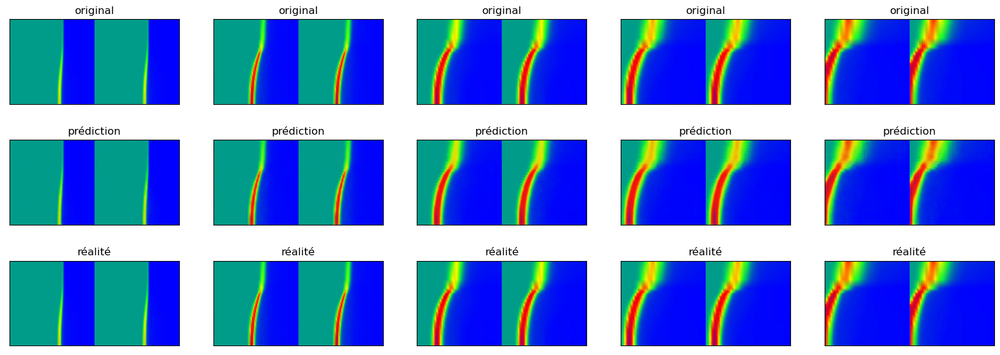

In [53]:
n = 5
plt.figure(figsize=(20, 7))
s=[2100,2300,2600,2800,2980]
for i in range(n):
  # display original
  ax = plt.subplot(3, n, i + 1)
  plt.imshow(Bdd_train[s[i]])
  plt.title("original")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)


  ax = plt.subplot(3, n, i + 1 + 2*n)
  plt.imshow(prediction_train[s[i]])
  plt.title("réalité")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)


  # display reconstruction
  ax = plt.subplot(3, n, i + 1 + n)
  plt.imshow(decoded_imgs[s[i]])
  plt.title("prédiction")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)


plt.show()

# LEVINA BICKEL ALGORITHM

In [14]:
from sklearn.neighbors import NearestNeighbors

def intrinsic_dim_sample_wise(X, k=5):
    neighb = NearestNeighbors(n_neighbors=k + 1).fit(X)
    dist, ind = neighb.kneighbors(X)
    dist = dist[:, 1:]
    dist = dist[:, 0:k]
    assert dist.shape == (X.shape[0], k)
    assert np.all(dist > 0)
    d = np.log(dist[:, k - 1: k] / dist[:, 0:k-1])
    d = d.sum(axis=1) / (k - 2)
    d = 1. / d
    intdim_sample = d
    return intdim_sample

def intrinsic_dim_scale_interval(X, k1=10, k2=20):
    X = pd.DataFrame(X).drop_duplicates().values # remove duplicates in case you use bootstrapping
    intdim_k = []
    for k in range(k1, k2 + 1):
        m = intrinsic_dim_sample_wise(X, k).mean()
        intdim_k.append(m)
    return intdim_k


In [21]:
encoded_imgs = autoencoder.encoder(np.concatenate((Bdd_train,Bdd_test))).numpy()
bis=encoded_imgs.reshape(len(Bdd_train)+len(Bdd_test),64)
print(encoded_imgs.shape)
dim = intrinsic_dim_scale_interval(bis,k1=5,k2=100)
print(np.array(dim).mean())

(2994, 1, 1, 64)
1.3424724664304726


## DEUXIEME AUTO ENCODEUR

### On rajoute le reste des images

In [15]:
#Fonction custom (sinus) dans TF
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Activation
from tensorflow.keras.utils import get_custom_objects

def custom_activation(x):
  
    return (tf.math.sin(30*x))
     
get_custom_objects().update({'custom_activation': Activation(custom_activation)})


In [10]:
#Création BDD pour le second auto-encodeur
encoded_imgs = autoencoder.encoder(np.concatenate((Bdd_train,Bdd_test))).numpy()

Bdd_train_2, Bdd_test_2 = train_test_split(encoded_imgs,
                                   random_state=104, 
                                   test_size=0.2, 
                                   shuffle=True)

In [17]:
#Variables pour initialiser les poids
b=1/float(64)
b0=math.sqrt(6/(64))/30
b1=math.sqrt(6/(128))/30
b2=math.sqrt(6/(64))/30
b3=math.sqrt(6/(32))/30
b4=math.sqrt(6/(4))/30



In [18]:
#Auto encodeur 2 avec latent_dim_2 le resultat approché de LB
latent_dim_2 = 2

class Autoencoder_2(Model):
  def __init__(self, latent_dim_2):
    super(Autoencoder_2, self).__init__()
    self.latent_dim_2 = latent_dim_2
    self.encoder_2 = tf.keras.Sequential([ 
    layers.Dense(64,activation='custom_activation',kernel_initializer=tf.keras.initializers.RandomUniform(minval=-b, maxval=b, seed=None),bias_initializer=initializers.Zeros()),
    layers.Dense(32,activation='custom_activation',kernel_initializer=tf.keras.initializers.RandomUniform(minval=-b1, maxval=b1, seed=None),bias_initializer=initializers.Zeros()),
    layers.Dense(16,activation='custom_activation',kernel_initializer=tf.keras.initializers.RandomUniform(minval=-b2, maxval=b2, seed=None),bias_initializer=initializers.Zeros()),
    layers.Dense(latent_dim_2,activation='custom_activation',kernel_initializer=tf.keras.initializers.RandomUniform(minval=-b3, maxval=b3, seed=None),bias_initializer=initializers.Zeros()),
    ])
    self.decoder_2 = tf.keras.Sequential([
        layers.Dense(16,activation='custom_activation',kernel_initializer=tf.keras.initializers.RandomUniform(minval=-b4, maxval=b4, seed=None),bias_initializer=initializers.Zeros()),
        layers.Dense(32,activation='custom_activation',kernel_initializer=tf.keras.initializers.RandomUniform(minval=-b3, maxval=b3, seed=None),bias_initializer=initializers.Zeros()), 
        layers.Dense(64,activation='custom_activation',kernel_initializer=tf.keras.initializers.RandomUniform(minval=-b2, maxval=b2, seed=None),bias_initializer=initializers.Zeros()),
        layers.Dense(64,activation='relu',kernel_initializer=tf.keras.initializers.RandomUniform(minval=-b1, maxval=b1, seed=None),bias_initializer=initializers.Zeros()),
    ])
  def call(self, x):
    encoded = self.encoder_2(x)
    decoded = self.decoder_2(encoded)
    return decoded
  
  
autoencoder_3 = Autoencoder_2(latent_dim_2) 


In [11]:

#Charger un autre modèle
autoencoder_2=tf.keras.models.load_model("../Modele/Hydro_AE2_Finale/")
#autoencoder_2=tf.keras.models.load_model("../Modele/Hydro_couleur_AE2/")

In [30]:

epoch=200 #epoch pour l'entrainement

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.2,
                              patience=5, min_lr=0.001)


train_size=len(Bdd_train_2)
batch_size=128
#Tentative de définition d'une nouvelle erreur via les CallBack

initial_learning_rate = 0.00000015
final_learning_rate = 0.00000001
learning_rate_decay_factor = (final_learning_rate / initial_learning_rate)**(1/epoch)
steps_per_epoch = int(train_size/batch_size)

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
                initial_learning_rate=initial_learning_rate,
                decay_steps=steps_per_epoch,
                decay_rate=learning_rate_decay_factor,
                staircase=True)

log_dir = "logs/fit/"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)   
    
autoencoder_2.compile(optimizer, loss=losses.MeanSquaredError())

#Execution de l'entrainement
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=100)

history2=autoencoder_2.fit(Bdd_train_2,Bdd_train_2,batch_size=batch_size,
                epochs=epoch,
                shuffle=True,
                validation_data=(Bdd_test_2, Bdd_test_2), callbacks=[callback,tensorboard_callback],
            )
              


2023-08-03 11:43:54.608552: I tensorflow/core/profiler/lib/profiler_session.cc:136] Profiler session initializing.
2023-08-03 11:43:54.608606: I tensorflow/core/profiler/lib/profiler_session.cc:155] Profiler session started.
2023-08-03 11:43:54.610149: I tensorflow/core/profiler/lib/profiler_session.cc:172] Profiler session tear down.
2023-08-03 11:43:54.610379: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1487] CUPTI activity buffer flushed


Epoch 1/200
15/19 [======================>.......] - ETA: 0s - loss: 0.0032

2023-08-03 11:43:55.172950: I tensorflow/core/profiler/lib/profiler_session.cc:136] Profiler session initializing.
2023-08-03 11:43:55.172993: I tensorflow/core/profiler/lib/profiler_session.cc:155] Profiler session started.
2023-08-03 11:43:55.253160: I tensorflow/core/profiler/lib/profiler_session.cc:71] Profiler session collecting data.
2023-08-03 11:43:55.253346: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1487] CUPTI activity buffer flushed
2023-08-03 11:43:55.254331: I tensorflow/core/profiler/internal/gpu/cupti_collector.cc:228]  GpuTracer has collected 0 callback api events and 0 activity events. 
2023-08-03 11:43:55.255582: I tensorflow/core/profiler/lib/profiler_session.cc:172] Profiler session tear down.
2023-08-03 11:43:55.257910: I tensorflow/core/profiler/rpc/client/save_profile.cc:137] Creating directory: logs/fit/train/plugins/profile/2023_08_03_11_43_55
2023-08-03 11:43:55.259652: I tensorflow/core/profiler/rpc/client/save_profile.cc:143] Dumped gzipped too

19/19 [==============================] - 1s 23ms/step - loss: 0.0032 - val_loss: 0.0053
Epoch 2/200
19/19 [==============================] - 0s 7ms/step - loss: 0.0033 - val_loss: 0.0053
Epoch 3/200
19/19 [==============================] - 0s 7ms/step - loss: 0.0034 - val_loss: 0.0053
Epoch 4/200
19/19 [==============================] - 0s 7ms/step - loss: 0.0032 - val_loss: 0.0053
Epoch 5/200
19/19 [==============================] - 0s 7ms/step - loss: 0.0032 - val_loss: 0.0053
Epoch 6/200
19/19 [==============================] - 0s 7ms/step - loss: 0.0031 - val_loss: 0.0053
Epoch 7/200
19/19 [==============================] - 0s 6ms/step - loss: 0.0033 - val_loss: 0.0053
Epoch 8/200
19/19 [==============================] - 0s 7ms/step - loss: 0.0032 - val_loss: 0.0053
Epoch 9/200
19/19 [==============================] - 0s 7ms/step - loss: 0.0032 - val_loss: 0.0053
Epoch 10/200
19/19 [==============================] - 0s 7ms/step - loss: 0.0032 - val_loss: 0.0053
Epoch 11/200
19/19 [

In [33]:
autoencoder_2.save("../Modele/Hydro_AE2_Finale")

2023-08-03 11:48:39.005010: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ../Modele/Hydro_AE2_Finale/assets


INFO:tensorflow:Assets written to: ../Modele/Hydro_AE2_Finale/assets


In [24]:
#Evaluation du modèle
print("Evaluate on test data")
results = autoencoder_2.evaluate(Bdd_train_2, Bdd_train_2, batch_size=128)
print("test loss, test acc:", results)

Evaluate on test data


2023-08-03 11:37:18.516622: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2023-08-03 11:37:18.534383: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2300000000 Hz


19/19 [==============================] - 0s 3ms/step - loss: 0.0240
test loss, test acc: 0.02295529469847679


Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 1, 1, 64)          4160      
_________________________________________________________________
dense_25 (Dense)             (None, 1, 1, 32)          2080      
_________________________________________________________________
dense_26 (Dense)             (None, 1, 1, 16)          528       
_________________________________________________________________
dense_27 (Dense)             (None, 1, 1, 2)           34        
Total params: 6,802
Trainable params: 6,802
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_28 (Dense)             (None, 1, 1, 16)          48        
____________________________

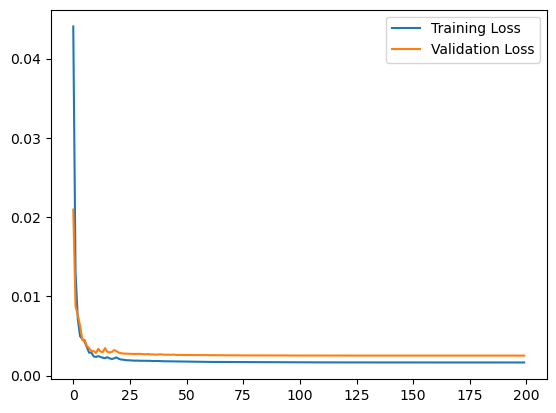

In [46]:
encoded_imgs_2 = autoencoder_2.encoder_2(Bdd_test_2).numpy()
decoded_imgs_2 = autoencoder_2.decoder_2(encoded_imgs_2).numpy()
autoencoder_2.encoder_2.summary()
autoencoder_2.decoder_2.summary()
plt.plot(history2.history["loss"], label="Training Loss")
plt.plot(history2.history["val_loss"], label="Validation Loss")
plt.legend()

Visualisation des espaces latents

In [12]:

#Generation de la base de données de toutes les intensités (sauf prediction)
#Testing[i] correspond à la simulation d'intensité i
nom_fichier="hydro"
n=1000
size=128
pas=1


Testing=[]

for i in range(0,5):
    Test=[]
    folder=i
    if folder==0:
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1003,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1004,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Test.append(np.concatenate((image1,image2),axis=1))

        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1004,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1005,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Test.append(np.concatenate((image1,image2),axis=1))

        for j in range(1005,2001,pas):
            image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j,4)+".gif").convert('RGB')
            image1=image1.resize((128,128),Image.ANTIALIAS)
            image1=np.array(image1)
            image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j+1,4)+".gif").convert('RGB')
            image2=image2.resize((128,128),Image.ANTIALIAS)
            image2=np.array(image2)
            Test.append(np.concatenate((image1,image2),axis=1))
    else:
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Test.append(np.concatenate((image1,image2),axis=1))

        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(3,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Test.append(np.concatenate((image1,image2),axis=1))

        for j in range(3,999,pas):
            image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j,4)+".gif").convert('RGB')
            image1=image1.resize((128,128),Image.ANTIALIAS)
            image1=np.array(image1)
            image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j+1,4)+".gif").convert('RGB')
            image2=image2.resize((128,128),Image.ANTIALIAS)
            image2=np.array(image2)
            Test.append(np.concatenate((image1,image2),axis=1))

    Test=np.array(Test)
    Test=Test/255
    Testing.append(Test)


/tmp/ipykernel_39016/18106980.py:16: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image1=image1.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_39016/18106980.py:19: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image2=image2.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_39016/18106980.py:24: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image1=image1.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_39016/18106980.py:27: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image2=image2.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_39016/18106980.py:33: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2

In [13]:
Testing=np.array(Testing)
Testing.shape

(5, 998, 128, 256, 3)

In [73]:
i=0
print("Evaluate on test data")
results = autoencoder.evaluate(Testing[i,:-2], Test2[i,2:], batch_size=128)
print("test loss, test acc:", results)

Evaluate on test data
8/8 [==============================] - 1s 126ms/step - loss: 7.3761e-04
test loss, test acc: 0.0007376122521236539


In [144]:
Test_decoded=autoencoder.decoder(autoencoder.encoder(Test3))


Espace latent avec I0 I1 I2

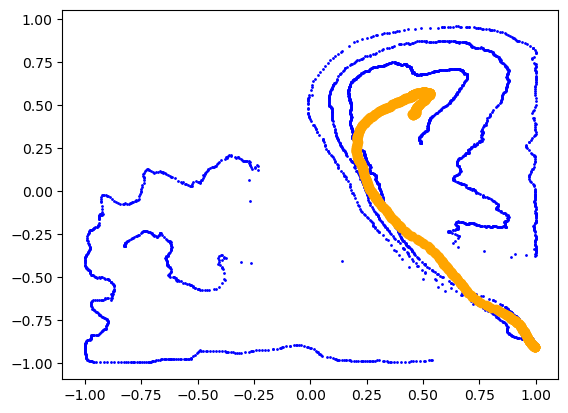

In [19]:
Bdd_test_3 = np.array(autoencoder_2.encoder_2(Bdd_test_2))
Bdd_train_3 = np.array(autoencoder_2.encoder_2(Bdd_train_2))
Test_reduced=np.array(autoencoder_2.encoder_2(autoencoder.encoder(Testing[0])))
Test_reduced1=np.array(autoencoder_2.encoder_2(autoencoder.encoder(Testing[1])))
Test_reduced2=np.array(autoencoder_2.encoder_2(autoencoder.encoder(Testing[2])))
Test_reduced3=np.array(autoencoder_2.encoder_2(autoencoder.encoder(Testing[3])))
Test_reduced4=np.array(autoencoder_2.encoder_2(autoencoder.encoder(Testing[4])))
n=len(Testing[0])
Xtr=[]
Ytr=[]
Xte=[]
Yte=[]
X=[]
Y=[]
X1=[]
X2=[]
Y1=[]
Y2=[]
X3=[]
Y3=[]
X4=[]
Y4=[]

for i in range(len(Bdd_test)):
    x=Bdd_test_3[i,0,0,0]
    y=Bdd_test_3[i,0,0,1]
    Xte.append(x)
    Yte.append(y)
for i in range(len(Bdd_train)):
    x=Bdd_train_3[i,0,0,0]
    y=Bdd_train_3[i,0,0,1]
    Xtr.append(x)
    Ytr.append(y)

for i in range(n):
    x=Test_reduced[i,0,0,0]
    y=Test_reduced[i,0,0,1]
    X.append(x)
    Y.append(y)

for i in range(n):
    x=Test_reduced1[i,0,0,0]
    y=Test_reduced1[i,0,0,1]
    X1.append(x)
    Y1.append(y)

for i in range(n):
    x=Test_reduced2[i,0,0,0]
    y=Test_reduced2[i,0,0,1]
    X2.append(x)
    Y2.append(y)

for i in range(n):
    x=Test_reduced3[i,0,0,0]
    y=Test_reduced3[i,0,0,1]
    X3.append(x)
    Y3.append(y)

for i in range(n):
    x=Test_reduced4[i,0,0,0]
    y=Test_reduced4[i,0,0,1]
    X4.append(x)
    Y4.append(y)

plt.scatter(Xte,Yte,color='blue',s=1)
plt.scatter(Xtr,Ytr,color='blue',s=1)
#plt.scatter(X,Y,color='green',s=1)
#plt.scatter(X1,Y1,color='yellow',s=1)
#plt.scatter(X2,Y2,color='red',s=1)


Medium01_0=[]
Medium01_1=[]
for i in range(len(X[:550])):
    Medium01_0.append((X[i]+X1[i])/2)
    Medium01_1.append((Y[i]+Y1[i])/2)
Medium01_0=np.array(Medium01_0)
Medium01_1=np.array(Medium01_1)
plt.scatter(Medium01_0,Medium01_1,color='orange')


#Vector=np.array(Vector)
#plt.scatter(Vector[:,0,0,0],Vector[:,0,0,1],color='orange')
#plt.scatter(X3,Y3,color='lime')
#plt.scatter(X4,Y4,color='orange')


In [128]:
print((np.array(X)+np.array(X1))/2)
print(X)
print(X1)

[ 9.95980263e-01  9.96012330e-01  9.95997787e-01  9.96194839e-01
  9.95578170e-01  9.94800985e-01  9.94454503e-01  9.93732095e-01
  9.93117750e-01  9.91489410e-01  9.90780175e-01  9.89628255e-01
  9.88458514e-01  9.87144232e-01  9.86429691e-01  9.86556292e-01
  9.85082150e-01  9.83645201e-01  9.80848968e-01  9.79642153e-01
  9.78284001e-01  9.77336168e-01  9.76089954e-01  9.75655735e-01
  9.75631714e-01  9.75530505e-01  9.74605799e-01  9.72610593e-01
  9.72161889e-01  9.71465111e-01  9.71280336e-01  9.70902443e-01
  9.70048606e-01  9.69168901e-01  9.67982411e-01  9.66555953e-01
  9.66440320e-01  9.66303110e-01  9.65480566e-01  9.64158416e-01
  9.62162197e-01  9.60938871e-01  9.60186720e-01  9.59601343e-01
  9.59243894e-01  9.58041549e-01  9.56601739e-01  9.53838706e-01
  9.52985525e-01  9.51332808e-01  9.51568425e-01  9.50065613e-01
  9.48242307e-01  9.46266174e-01  9.43261802e-01  9.42723155e-01
  9.42236423e-01  9.40835893e-01  9.40718770e-01  9.40059721e-01
  9.37125802e-01  9.34136

(-1.0, 1.0)

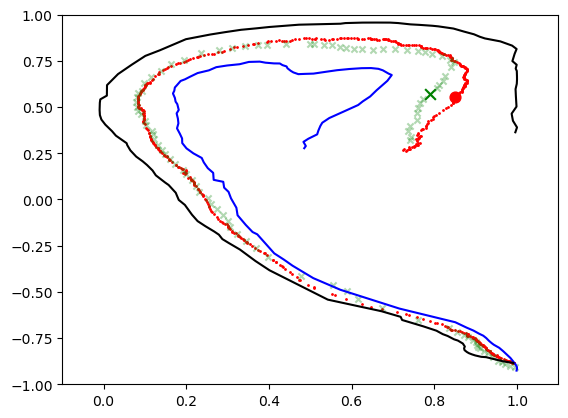

In [126]:
#Importantion des intensités I0 I1 I2 pour les splines cubiques
I_0=np.loadtxt('Intensites/I0_v_final.txt')
I_1=np.loadtxt('Intensites/I1_v_final.txt')
I_2=np.loadtxt('Intensites/I2_v_final.txt')

x_values=X[:]
y_values=Y[:]
cs_x0 = CubicSpline(np.arange(len(x_values)), x_values)
cs_y0 = CubicSpline(np.arange(len(y_values)), y_values)
t = np.linspace(0, len(x_values) - 1, 100)
x_curve0 = cs_x0(t)
y_curve0 = cs_y0(t)

x_values=X1[:550]
y_values=Y1[:550]
cs_x1 = CubicSpline(np.arange(len(x_values)), x_values)
cs_y1 = CubicSpline(np.arange(len(y_values)), y_values)
t = np.linspace(0, len(x_values) - 1, 100)
x_curve1 = cs_x1(t)
y_curve1 = cs_y1(t)

x_values=X2[:300]
y_values=Y2[:300]
cs_x2 = CubicSpline(np.arange(len(x_values)), x_values)
cs_y2= CubicSpline(np.arange(len(y_values)), y_values)
t = np.linspace(0, len(x_values) - 1, 100)
x_curve2 = cs_x2(t)
y_curve2 = cs_y2(t)


plt.plot(x_curve0, y_curve0, label='0',c='blue')
plt.plot(x_curve2, y_curve2, label='1',c='black')
#plt.plot(x_curve1, y_curve1, label='1',c='green')
plt.scatter(X1[:550],Y1[:550],c='red',s=1)
plt.scatter(X1[495],Y1[495],c='red',s=60)
a=(x_curve0+x_curve2)/2
b=(y_curve0+y_curve2)/2
plt.scatter(a,b,label='01',c='green',s=20,marker="x",alpha=0.3)
plt.scatter(a[90],b[90],label='01',c='green',s=60,marker="x",alpha=1)
#plt.plot(x_curve2, y_curve2, label='2')
#plt.plot((x_curve2+x_curve1)/2,(y_curve2+y_curve1)/2,label='12')

#plt.plot(np.array(X3[:550]),np.array(Y3[:550]),color='red')
#plt.scatter(X4[:39],Y4[:39],color='orange')
plt.xlim(-0.1,1.1)
plt.ylim(-1,1)

In [138]:
xii=(x_curve0+x_curve1)/2
yii=(y_curve0+y_curve1)/2


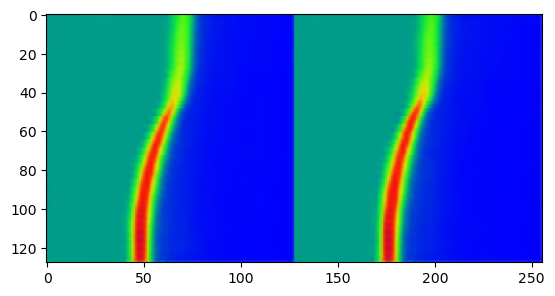

In [139]:
#Fonction qui étant donné x et y produit le vecteur latent dans l'espace et le décoder et donne l'image
def Image(x,y):
    Image=np.array([[[[x,y]]]])
    decodage_2=np.array(autoencoder_2.decoder_2(Image))
    Res=autoencoder.decoder(decodage_2)
    return(np.array(Res[0]))

plt.imshow(Image(0,0))

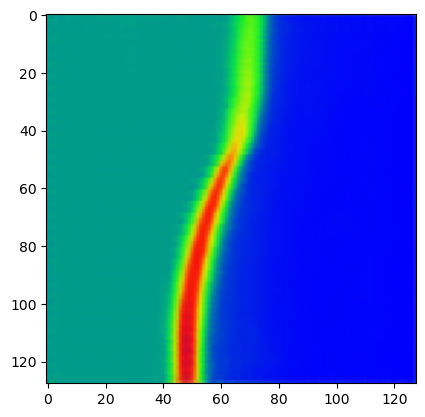

In [62]:
def Image_bis(x,y):
    Image=np.array([[[[x,y]]]])
    decodage_2=np.array(autoencoder_2.decoder_2(Image))
    Res=autoencoder.decoder(decodage_2)
    Res_1=np.array([np.split(Res[i],2,axis=1) for i in range(0,len(Res))])
    return(Res_1[0,0])

plt.imshow(Image_bis(0,0))

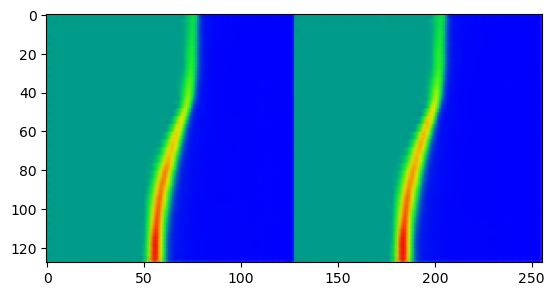

In [141]:
#Affichage de l'animation pour des vecteurs personnalisées 
#Par exemple pour les vecteurs correspondant à la courbe entre celle de I0 et celle de I1

fig = plt.figure()
ims2 = []


            
for i in range(len(xii)):
    img=Image(xii[i],yii[i])
    im=plt.imshow(img,animated=True)
    ims2.append([im])
    
ani = animation.ArtistAnimation(fig, ims2, interval=50, blit=True,
                                repeat_delay=1000)

ani.save('../Animation/hydro/dynamic_images'+'random'+'.gif')

plt.show()

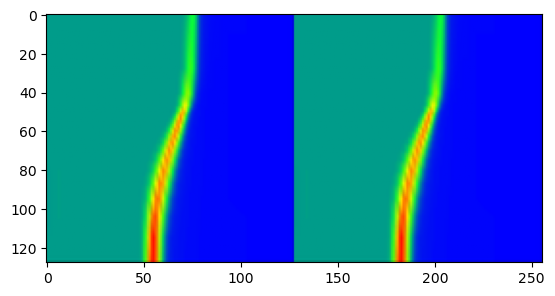

In [153]:
#Affichage de l'animation pour des vecteurs personnalisées 
#Par exemple pour les vecteurs correspondant à la courbe entre celle de I0 et celle de I1

fig = plt.figure()
ims2 = []


            
for i in range(0,len(X3[:680]),int(len(X3[:680])/100)):
    
    im=plt.imshow(Testing[3,i],animated=True)
    ims2.append([im])
    
ani = animation.ArtistAnimation(fig, ims2, interval=50, blit=True,
                                repeat_delay=1000)

ani.save('../Animation/hydro/dynamic_images'+'CHIC'+'.gif')

plt.show()

maillage espace latent

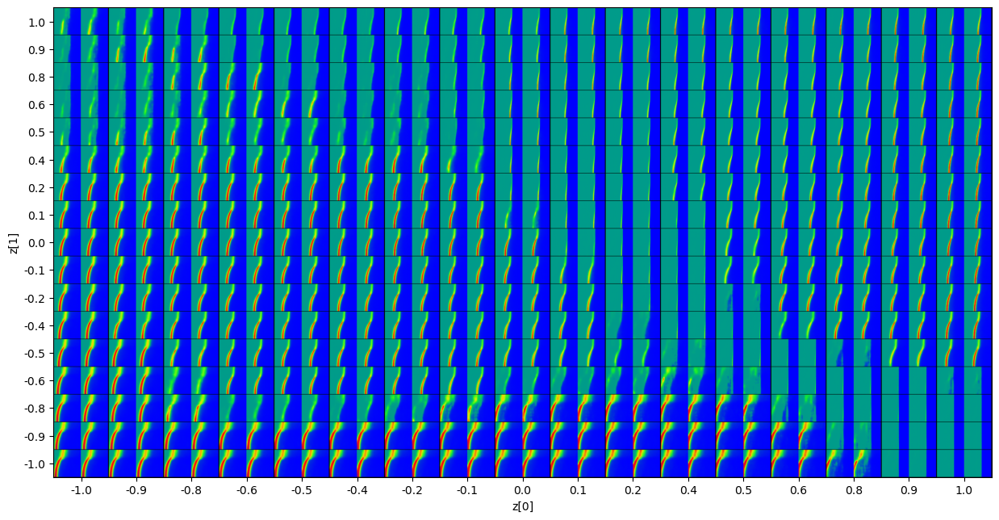

In [58]:
#Fonction pour mailler l'espace latent 
def plot_latent_space(ae, n=17, figsize=15):
    # display a n*n 2D manifold of digits
    digit_size = 128
    scale = 1.0
    figure = np.zeros((digit_size * n, 2*digit_size * n,3))
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            x_decoded=Image(xi,yi)
            digit = x_decoded
            digit[:,0,:]=0
            digit[:,1,:]=0
            digit[:,2*digit_size-2,:]=0
            digit[:,2*digit_size-1,:]=0
            digit[0,:,:]=0
            digit[digit_size-1,:,:]=0

          
            figure[
                i * digit_size : (i + 1) * digit_size,
                2*j * digit_size : 2*(j + 1) * digit_size,:
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(2*pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure,cmap='inferno')

    plt.show()


plot_latent_space(autoencoder_2)

In [65]:
np.where(np.array(Y2[:])>0.2)

(array([123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135,
        136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
        149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161,
        162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174,
        175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187,
        188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200,
        201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213,
        214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226,
        227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239,
        240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252,
        253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265,
        266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278,
        279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291,
        292, 293, 294, 295, 296, 297, 298, 299, 300

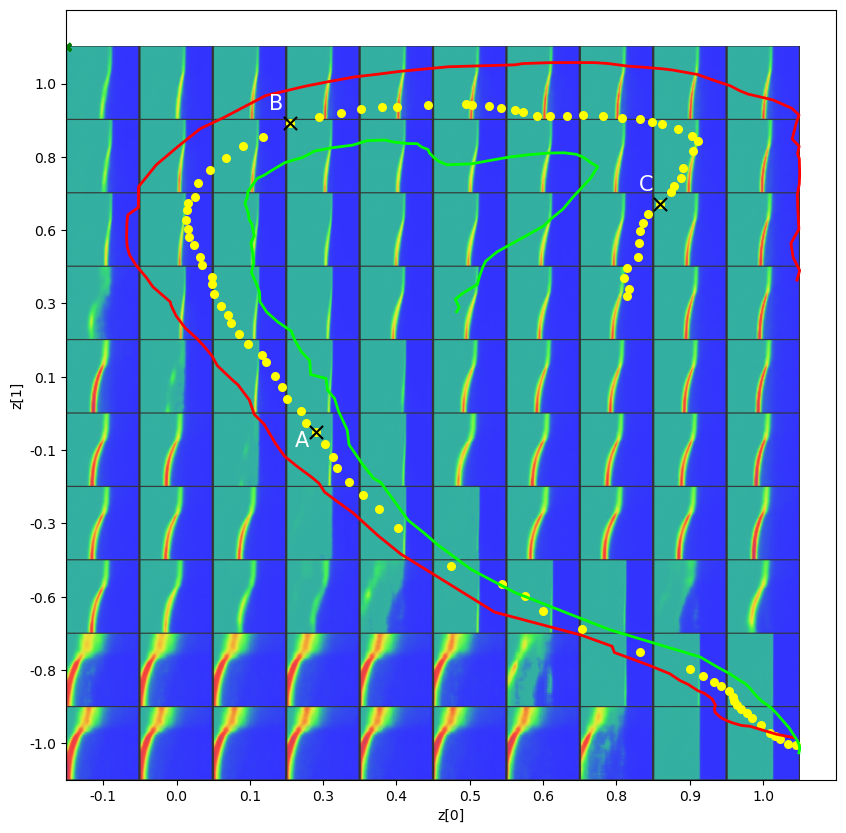

In [98]:
#Fonction pour mailler l'espace latent 
def plot_latent_space_transparent(ae, n=10, figsize=10):
    # display a n*n 2D manifold of digits
    digit_size = 128
    scale = 1.0
    figure = np.zeros((digit_size * n, digit_size * n,3))
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    depart=-0.1
    grid_x = np.linspace(depart, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    Xprime=np.array([[((x_curve0[i]+0.1)/1.1)*n*digit_size,(-y_curve0[i]+scale)*n*digit_size/2] for i in range(len(x_curve0))])
    #X1prime=np.array([[((X1[i]+0.1)/1.1)*n*digit_size,(-Y1[i]+scale)*n*digit_size/2] for i in range(0,550)])

    X2prime=np.array([[((x_curve2[i]+0.1)/1.1)*n*digit_size,(-y_curve2[i]+scale)*n*digit_size/2] for i in range(0,100)])
    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            #print(yi)
            x_decoded=Image_bis(xi,yi)
            digit = x_decoded
            digit[:,0,:]=0
            digit[:,1,:]=0
            digit[:,digit_size-2,:]=0
            digit[:,digit_size-1,:]=0
            digit[0,:,:]=0
            digit[digit_size-1,:,:]=0

          
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,:
            ] = digit

    
        
    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")

    plt.imshow(figure,cmap='inferno',alpha=0.8)
    plt.plot(X2prime[:,0],X2prime[:,1],color='red',lw=2.0)
    plt.plot(Xprime[:,0],Xprime[:,1],color='lime',lw=2.0)

    plt.scatter((x_curve0+x_curve2)/2,(y_curve0+y_curve2)/2,label='01',c='green',s=20,marker="x",alpha=0.3)
    X1prime=np.array([[((((x_curve0[i]+x_curve2[i])/2)+0.1)/1.1)*n*digit_size,(-(y_curve0[i]+y_curve2[i])/2+scale)*n*digit_size/2] for i in range(len(x_curve0))])

    plt.scatter(X1prime[:,0],X1prime[:,1],color='yellow',s=30)
    plt.scatter(X1prime[30,0],X1prime[30,1],color='black',s=90,marker='x')
    plt.scatter(X1prime[60,0],X1prime[60,1],color='black',s=90,marker='x')
    plt.scatter(X1prime[90,0],X1prime[90,1],color='black',s=90,marker='x')
    plt.annotate("C", (X1prime[90,0], X1prime[90,1]), textcoords="offset points", xytext=(-10, 10), ha='center',fontsize=15,c='white')
    plt.annotate("B", (X1prime[60,0], X1prime[60,1]), textcoords="offset points", xytext=(-10, 10), ha='center',fontsize=15,c='white')
    plt.annotate("A", (X1prime[30,0], X1prime[30,1]), textcoords="offset points", xytext=(-10, -10), ha='center',fontsize=15,c='white')

    plt.show()



plot_latent_space_transparent(autoencoder_2)


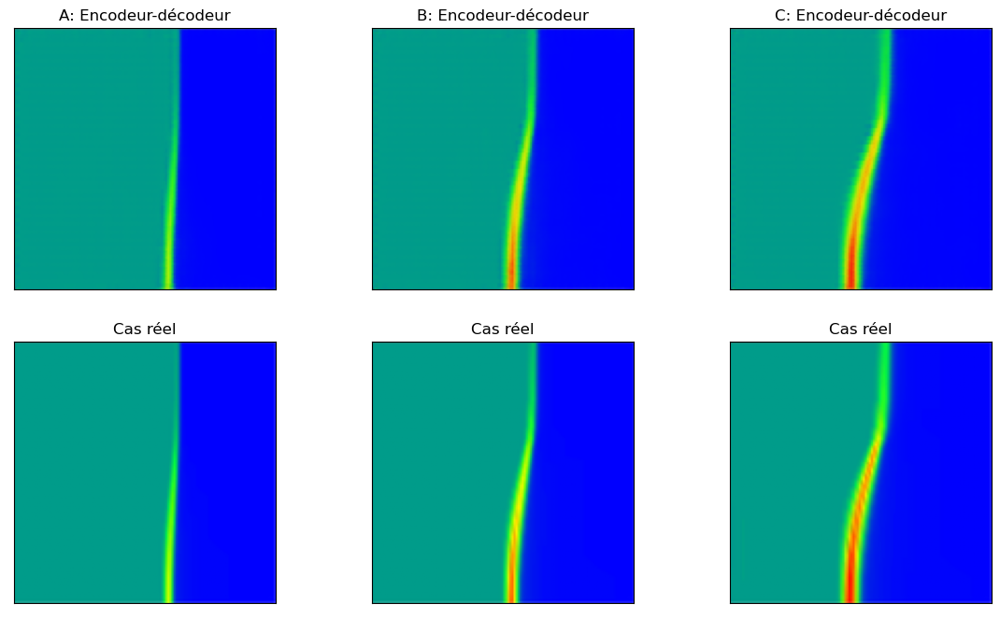

In [136]:
X1prime=np.array((x_curve0+x_curve2)/2)
Y1prime=np.array((y_curve0+y_curve2)/2)

n = 3
s=[30,60,90]
r=[161,316,495]
char=["A","B","C"]
plt.figure(figsize=(14, 8))
for i in range(n):
  # display original
  ax = plt.subplot(2, n, i + 1)
  plt.imshow(Image_bis(X1prime[s[i]],Y1prime[s[i]]))
  plt.title(char[i]+": Encodeur-décodeur")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  ax = plt.subplot(2, n, n+i + 1)
  plt.imshow(np.split(Testing[1,r[i]],2,axis=1)[0])
  plt.title("Cas réel")
  plt.gray()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)



0


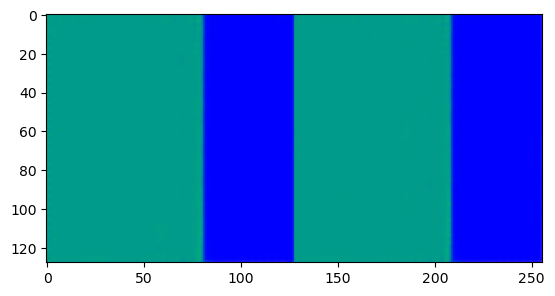

1


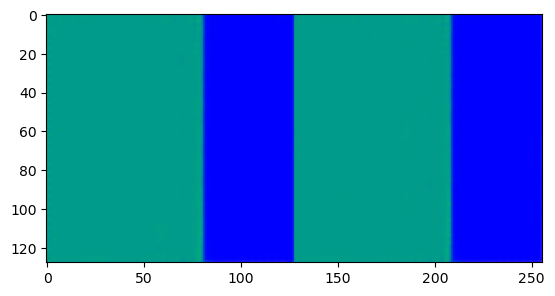

2


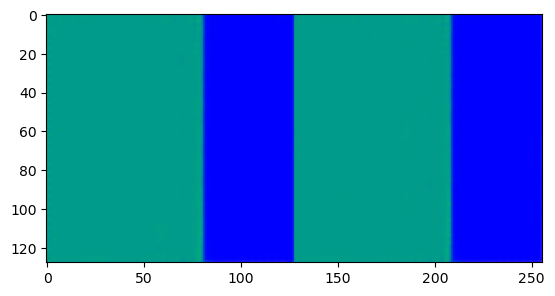

3


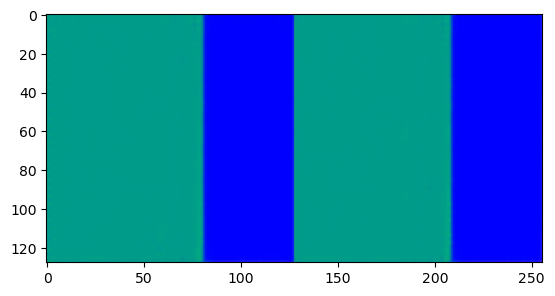

4


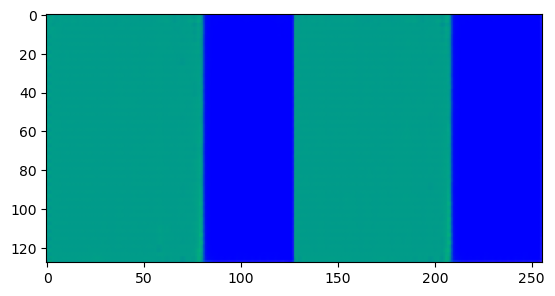

5


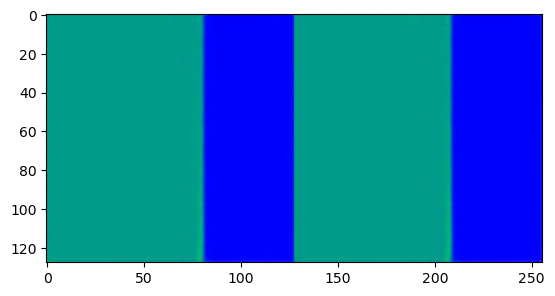

6


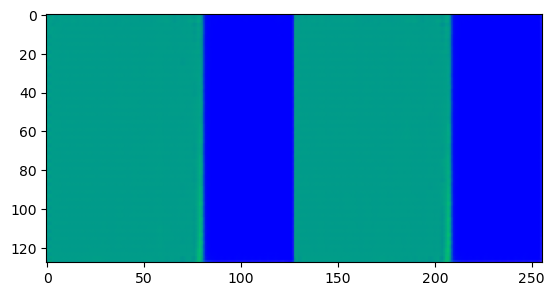

7


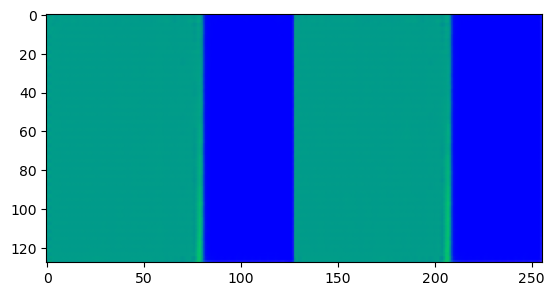

8


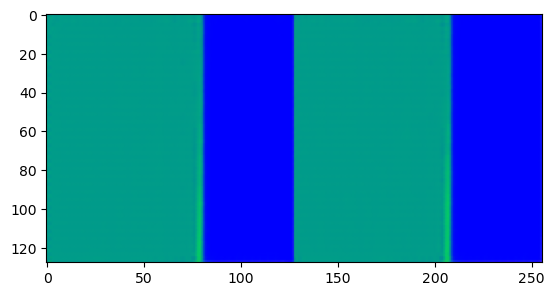

9


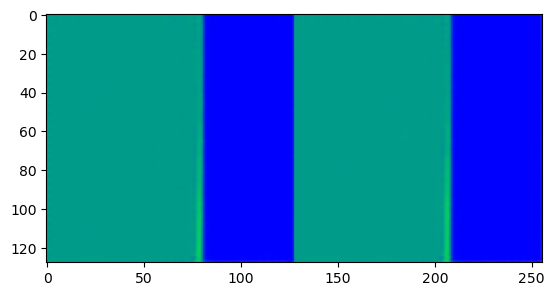

10


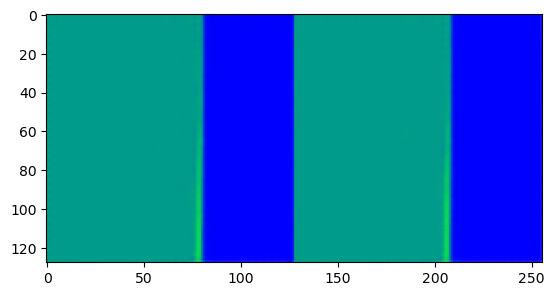

11


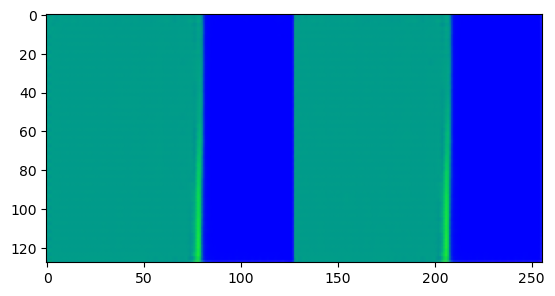

12


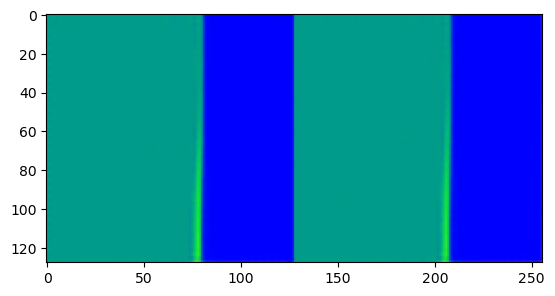

13


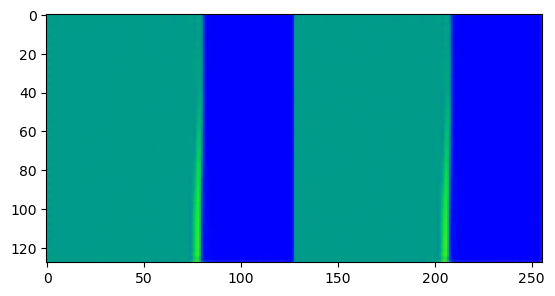

14


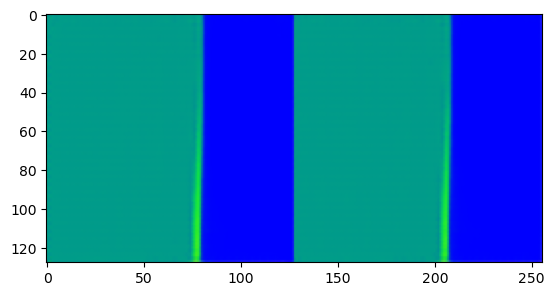

15


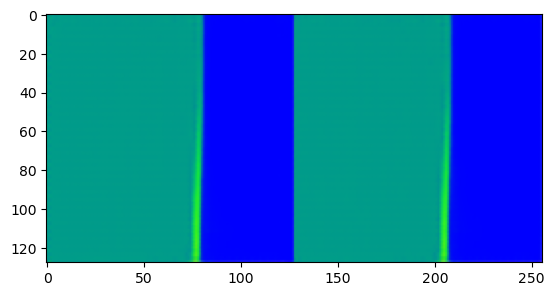

16


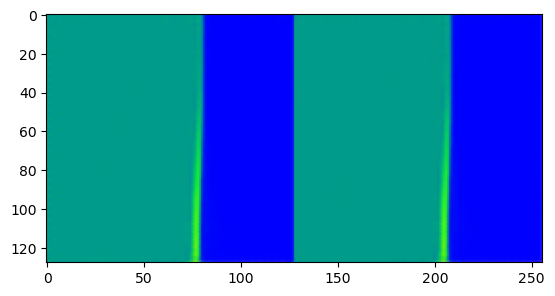

17


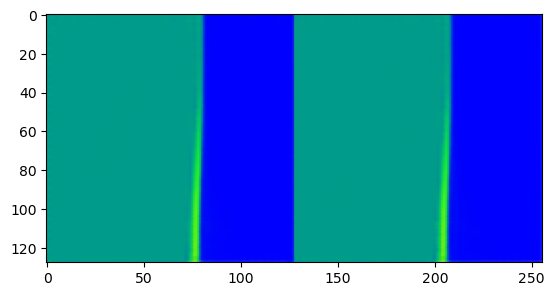

18


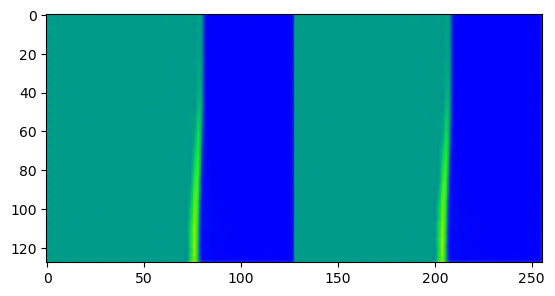

19


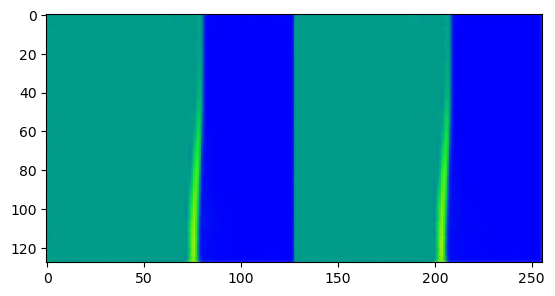

20


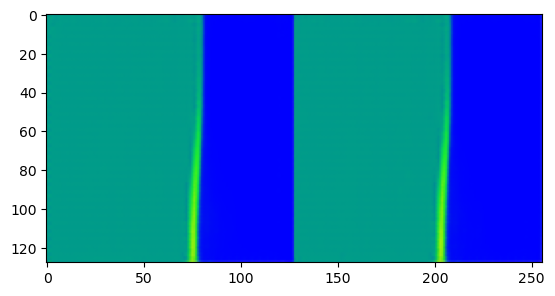

21


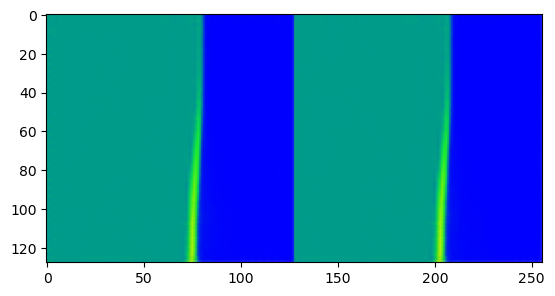

22


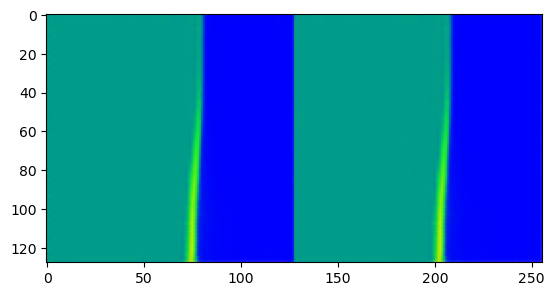

23


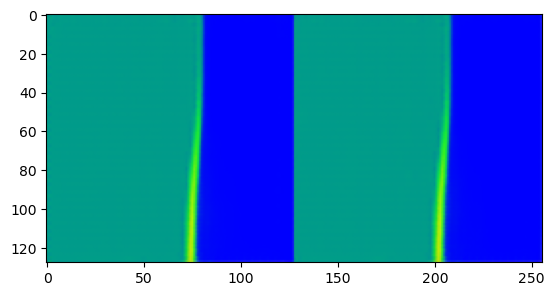

24


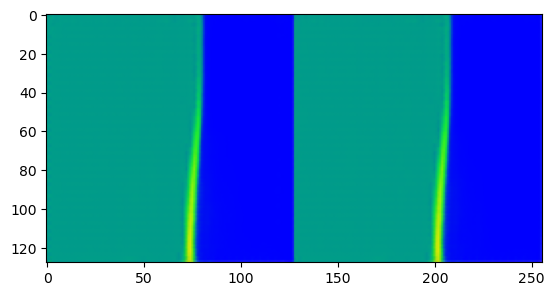

25


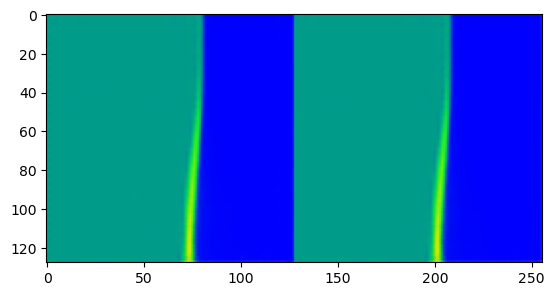

26


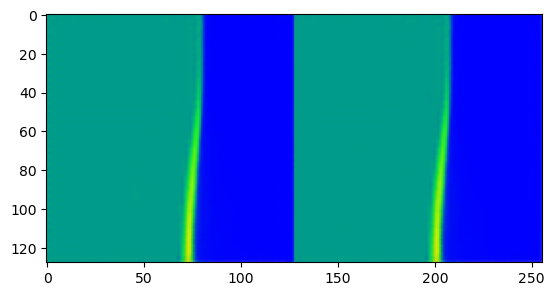

27


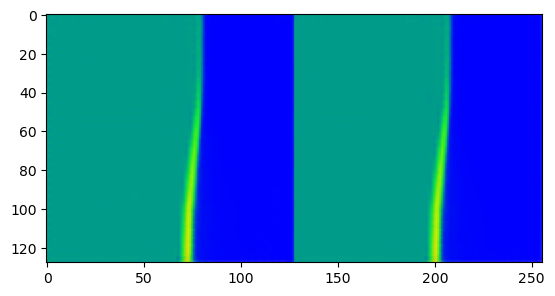

28


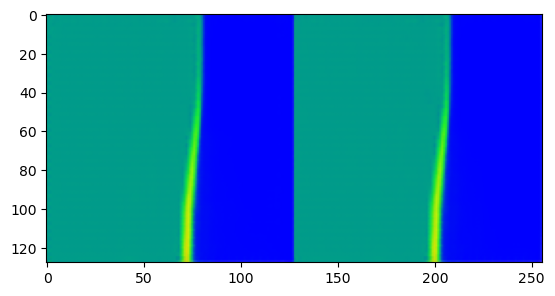

29


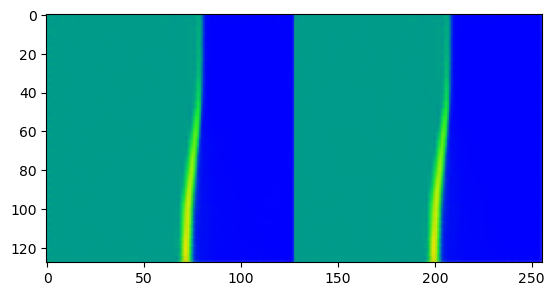

30


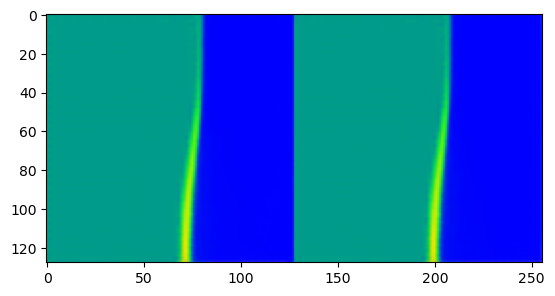

31


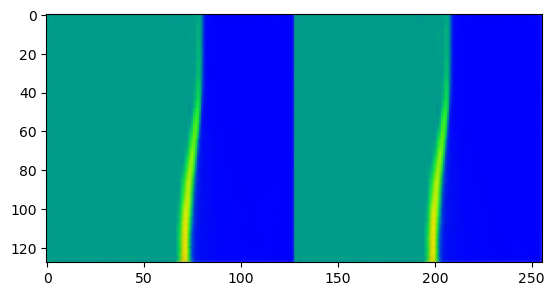

32


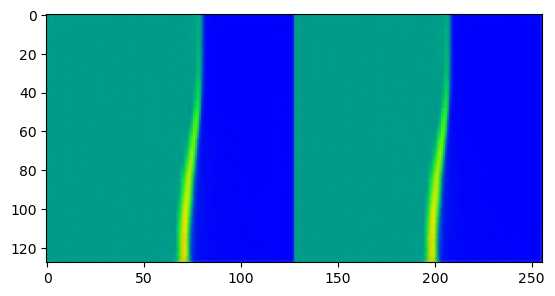

33


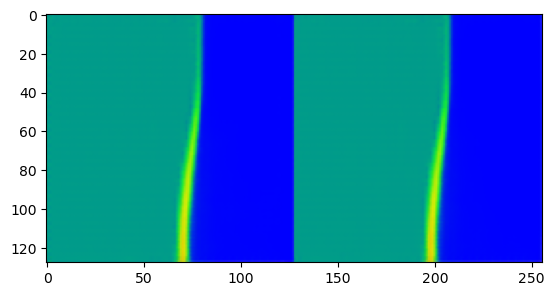

34


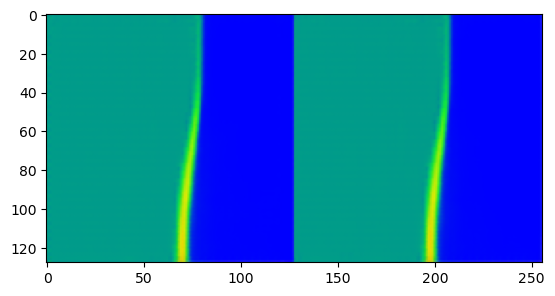

35


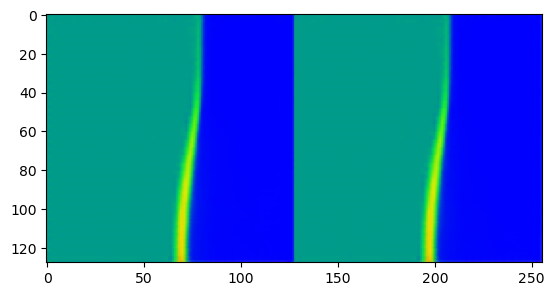

36


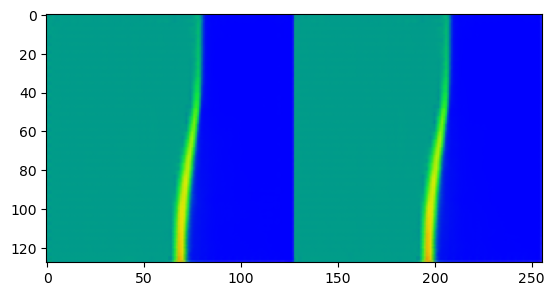

37


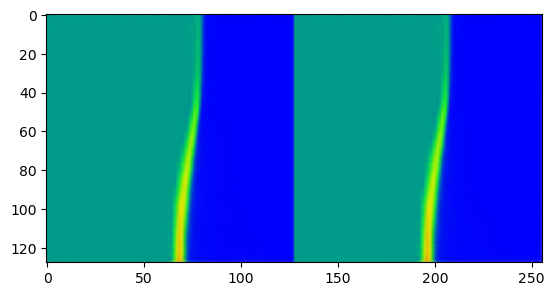

38


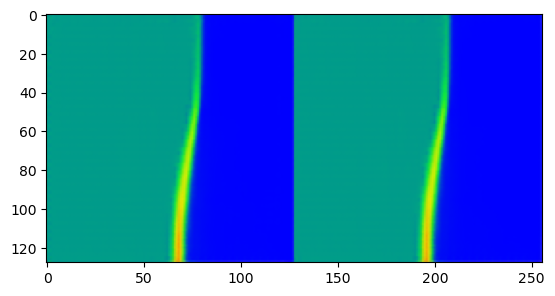

39


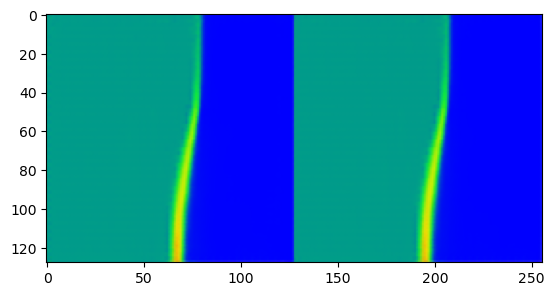

40


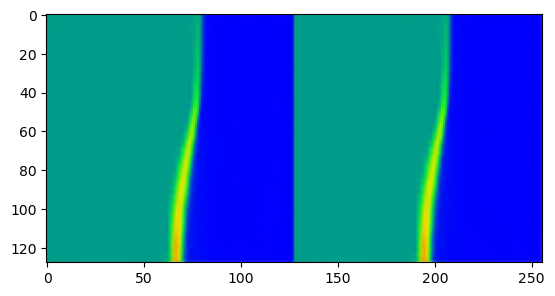

41


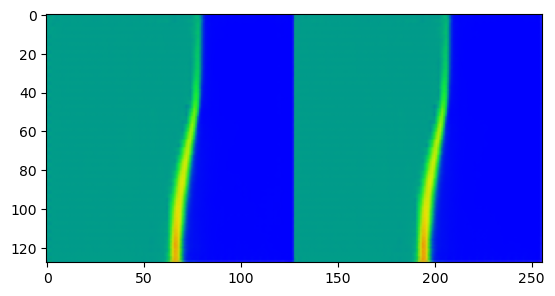

42


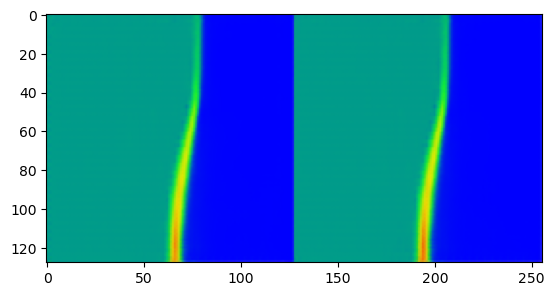

43


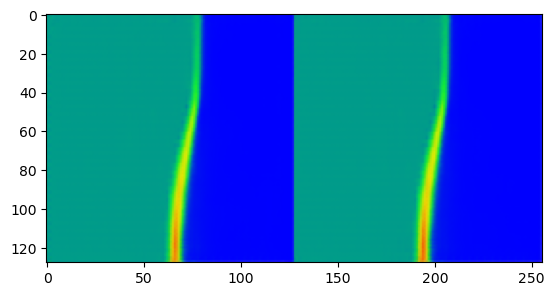

44


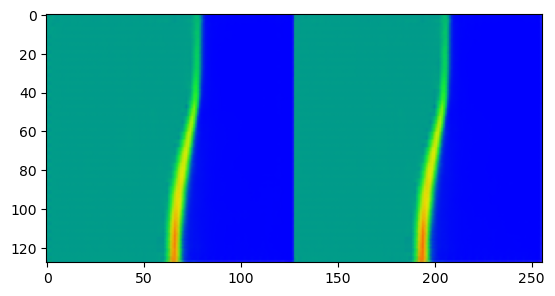

45


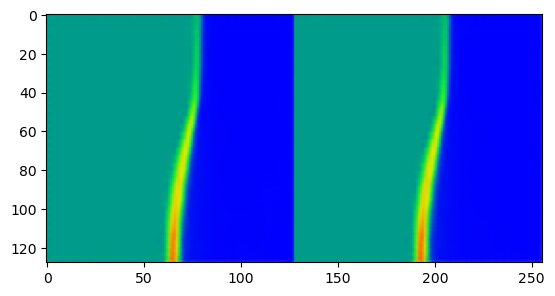

46


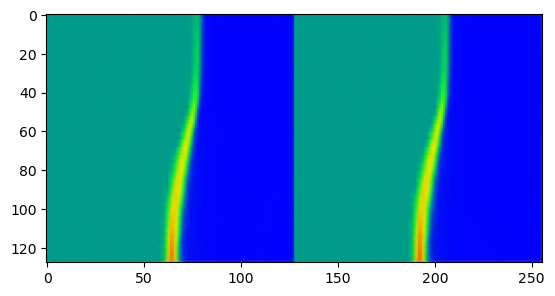

47


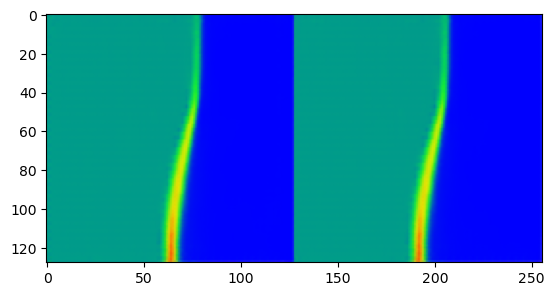

48


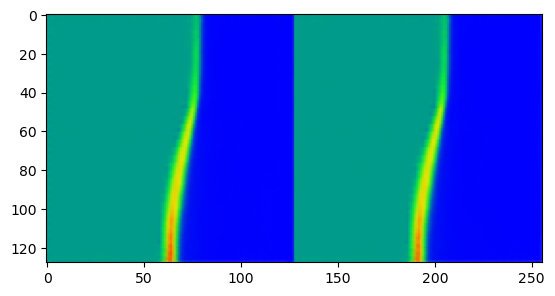

49


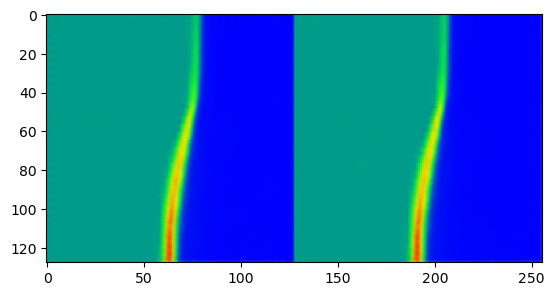

50


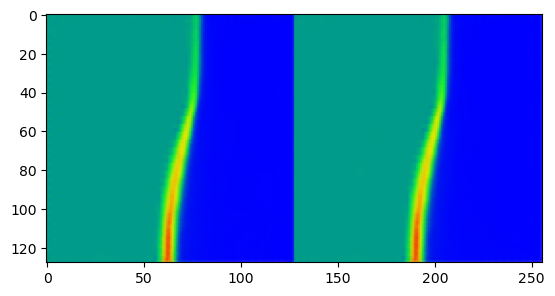

51


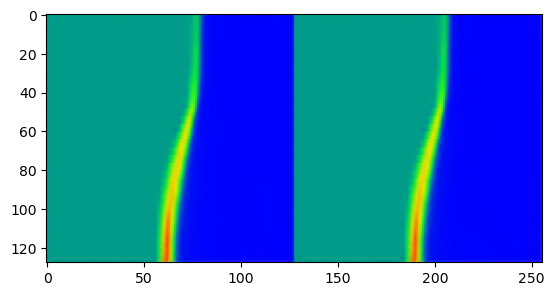

52


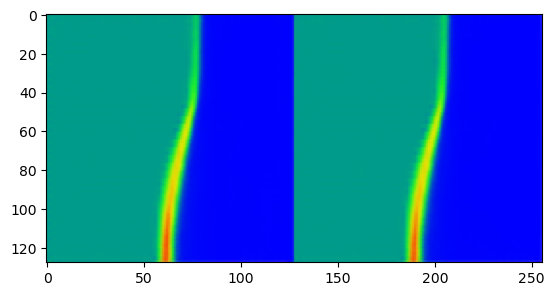

53


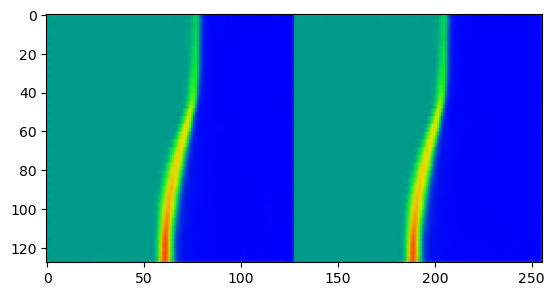

54


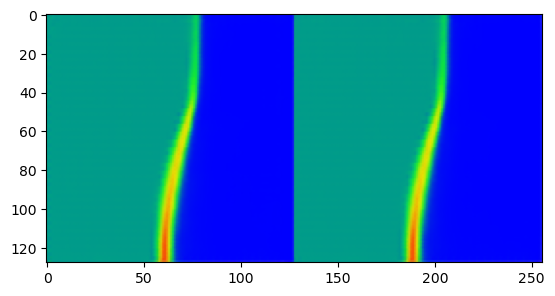

55


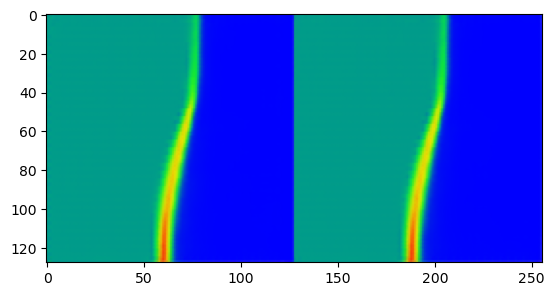

56


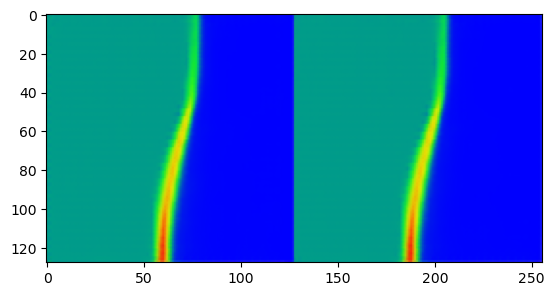

57


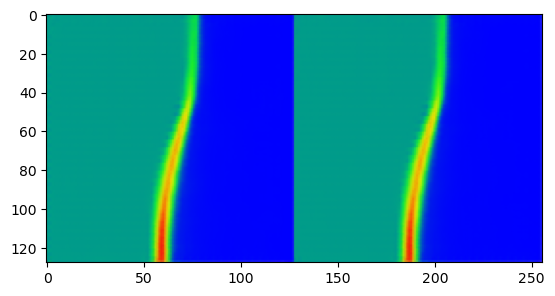

58


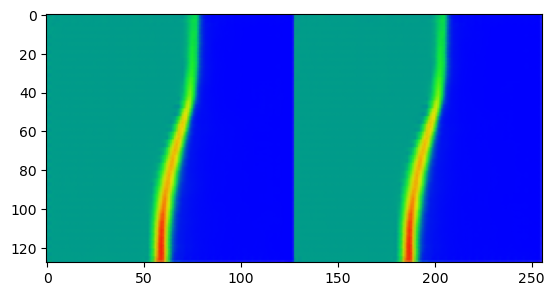

59


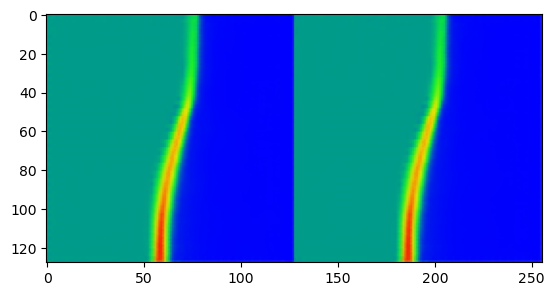

60


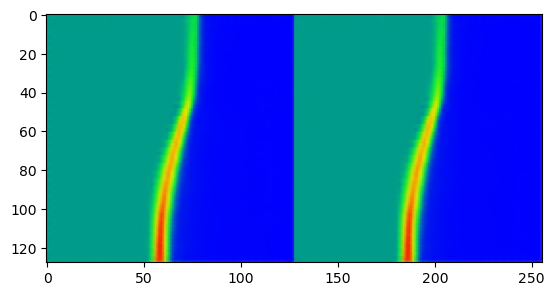

61


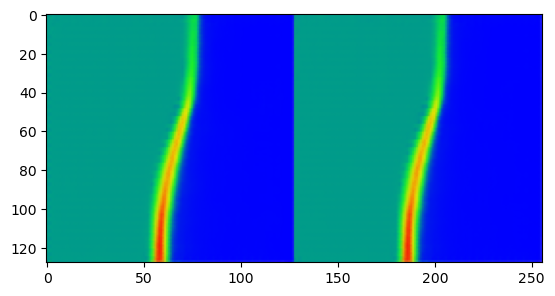

62


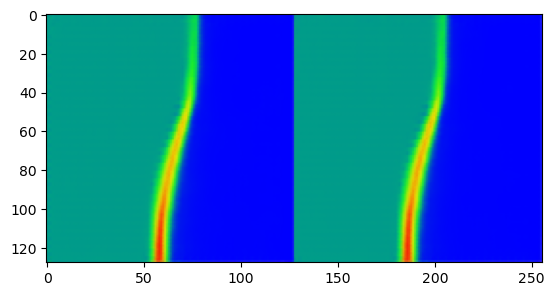

63


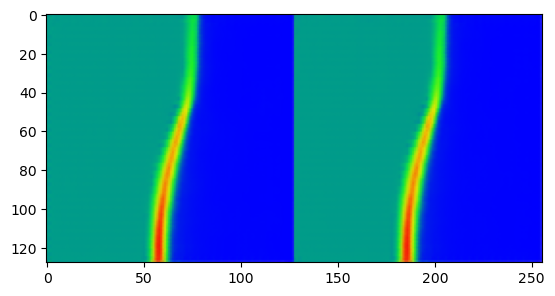

64


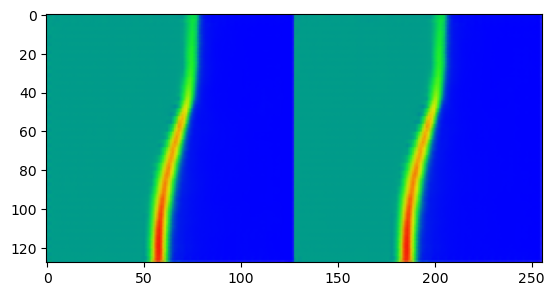

65


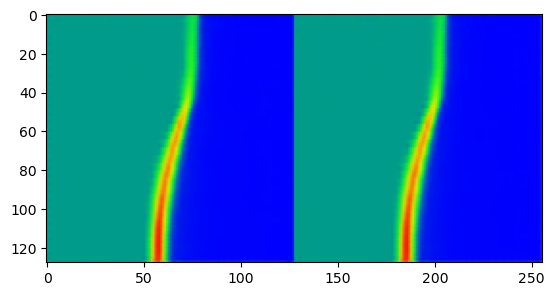

66


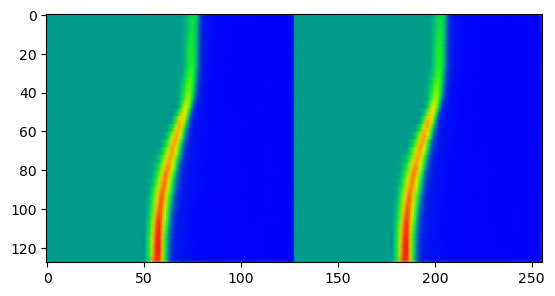

67


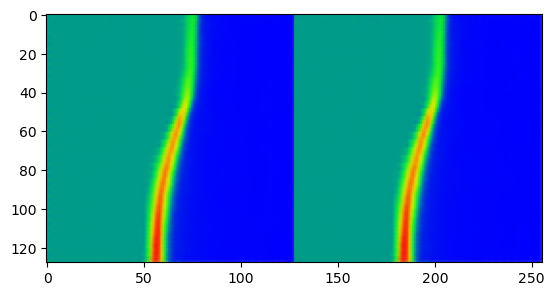

68


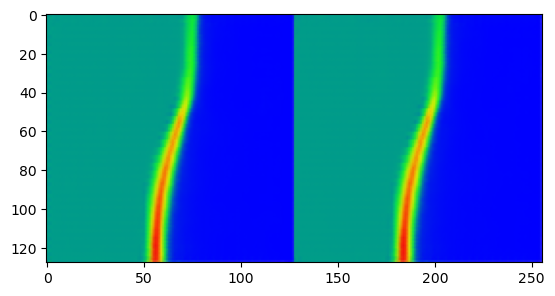

69


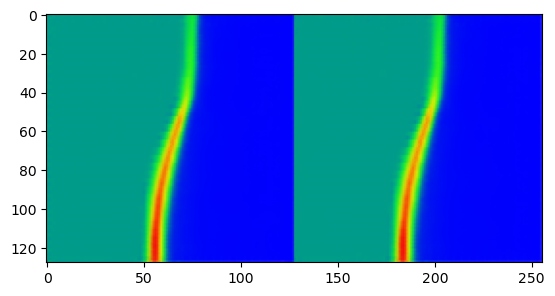

70


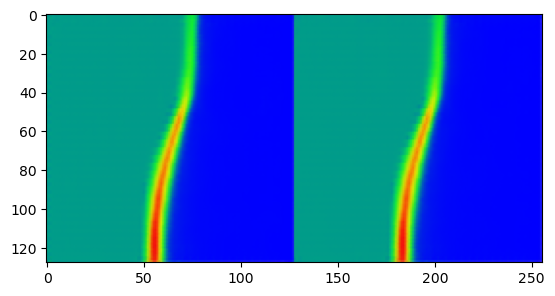

71


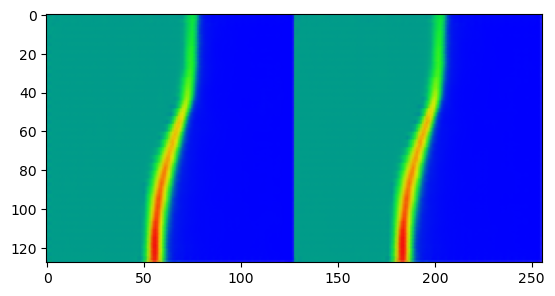

72


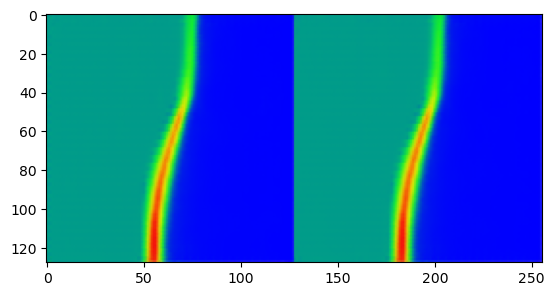

In [63]:
for i in range(73):
    print(i)
    plt.imshow(Image(X3[i],Y3[i]))
    plt.show()
    plt.close()


Animation espace latent : script pour afficher d'une part l'espace latent que l'on parcourt et d'autre part le pendule ou l'image de manière plus générale

In [10]:
#Fonction qui crée la double image Espace latent actualisé + Image correspondante du phénomène physique
#Il faut donner :
# Bdd_image : Image la simulation considérée
#Bdd Vecteur latent de la simulation considérée
#Bdd_train1 les vecteurs latents de toute la base de données train (Intensités connus)
#Bdd_test1 les vecteurs latents de toute la base de données de test (Intensités connus)
#long_terme=True *NOn disponible dans ce code* optionnel, pour afficher les predictions 
#stabilisation=True *NOn disponible dans ce code* optionnel, pour que les prédictions soient stabilisées ou non 

def create_images_parcours_AE2(Bdd_image,Bdd,Bdd_train1,Bdd_test1,long_terme=True,stabilisation=True):
    #Créer la figure
    plt.ion
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    latent_pca_2=autoencoder_2.encoder_2(np.array(np.concatenate((Bdd_train1,Bdd_test1,Bdd),axis=0)))
    

    #axes[1].imshow(image, cmap='gray')
    Xte=[]
    Yte=[]
    X1=[]
    Y1=[]

     
    Serie=[]
    #Images=np.array(autoencoder.decoder(Bdd))
    Images=Bdd_image

    n=len(Bdd_test1)+len(Bdd_train1)
    n1=n+len(Bdd)       

    for i in range(n):
        x=latent_pca_2[i,0,0,0]
        y=latent_pca_2[i,0,0,1]
        Xte.append(x)
        Yte.append(y)
    

    for i in range(n,n1):
        x=latent_pca_2[i,0,0,0]
        y=latent_pca_2[i,0,0,1]
        X1.append(x)
        Y1.append(y)

    axes[0].scatter(Xte,Yte,color='blue',s=1)

    image = axes[1].imshow(Images[0],cmap='gray')
    axes[1].get_xaxis().set_visible(False)
    axes[1].get_yaxis().set_visible(False)

    n=len(Bdd)

    print("Creation des images\n")
    for i in range(n-1):
        axes[0].scatter(X1[i:i+1],Y1[i:i+1],color='red')
        image.set_data(Images[i])
        fig.canvas.draw()
        fig.canvas.flush_events()
        plt.savefig("../Images/"+str(i)+".png")



    axes[0].scatter(X1[(n-1):],Y1[(n-1):],color='red',marker='x')
    image.set_data(Images[n-1])
    fig.canvas.draw()
    fig.canvas.flush_events()
    plt.savefig("../Images/"+str(n-1)+".png")


    print("Creation du gif")

    
#Creation du gif a partir de l'adresse de sauvegarde de la fonction précédente (create_image_parcours_AE2)
   
def create_gif(file,taille,title="latent_pred"):
    fig=plt.figure(figsize=(20,10))
    ims=[]
    
    for i in range(0,taille):
        Pendule=mpimg.imread(file+str(i)+".png")
        plt.axis('off')
        im=plt.imshow(Pendule,animated=True,cmap='gray')
        ims.append([im])

    ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=10000)

    ani.save(title+".gif")
    plt.show()
   



In [17]:
#Creation gif des animations (avec concaténation des instants t et t+dt)
def create_gif_imz(index,title="hydro"):
    fig=plt.figure(figsize=(20,10))
    ims=[]
    
    for i in range(0,len(Testing[0])):
        plt.axis('off')
        im=plt.imshow(Testing[index,i],animated=True,cmap='gray')
        ims.append([im])

    ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=10000)

    ani.save(title+".gif")
    plt.show()
   


IndexError: index 5 is out of bounds for axis 0 with size 5

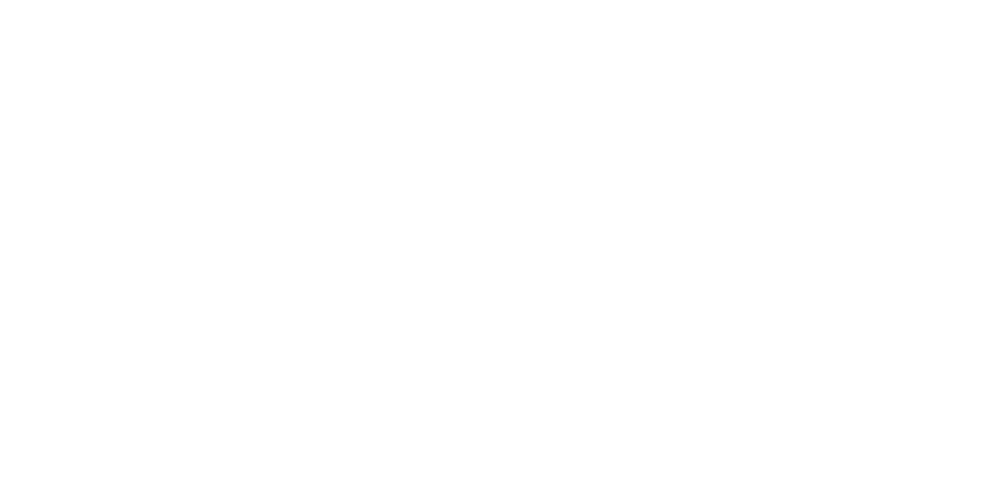

In [23]:
create_gif_imz(4,"4")

Creation des images

Creation du gif


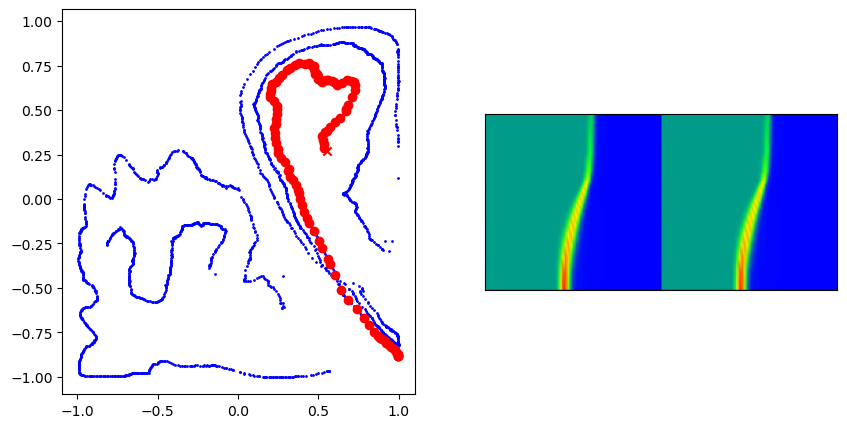

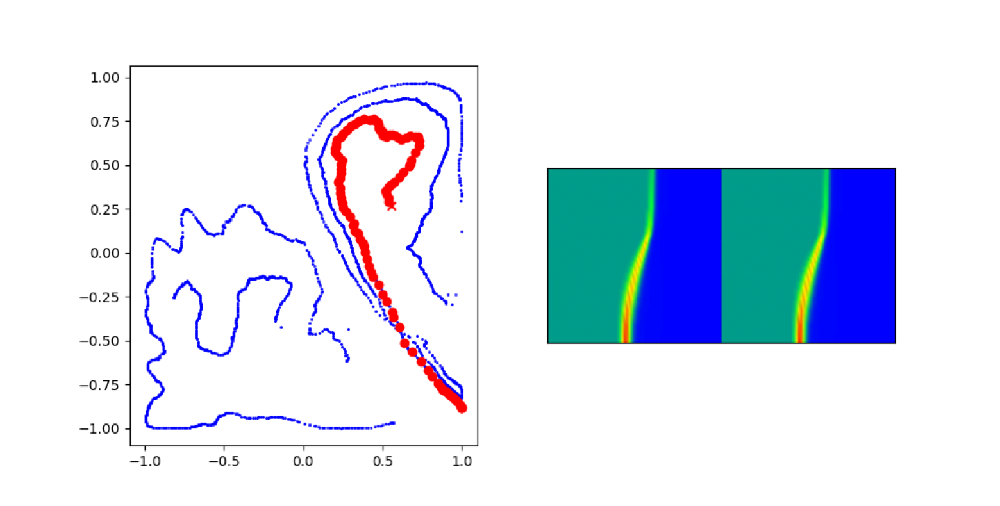

Creation des images

Creation du gif


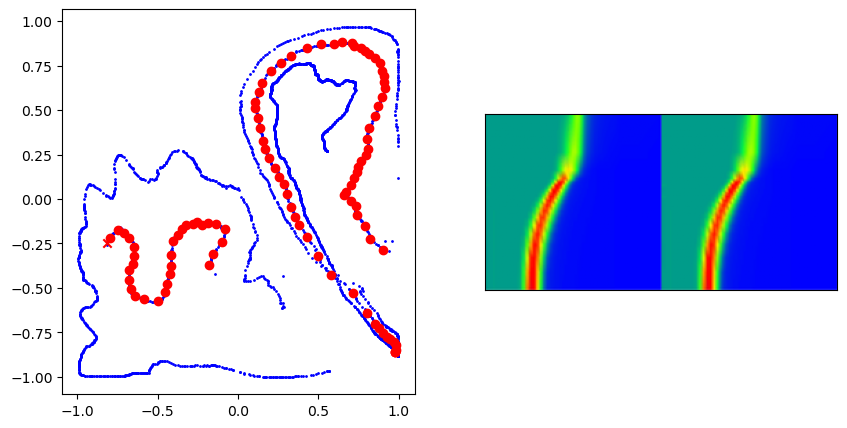

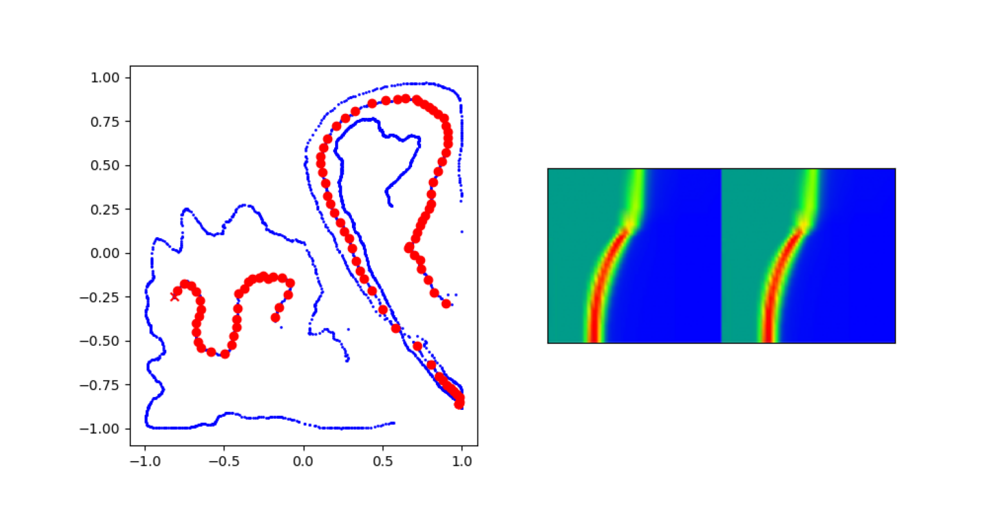

Creation des images

Creation du gif


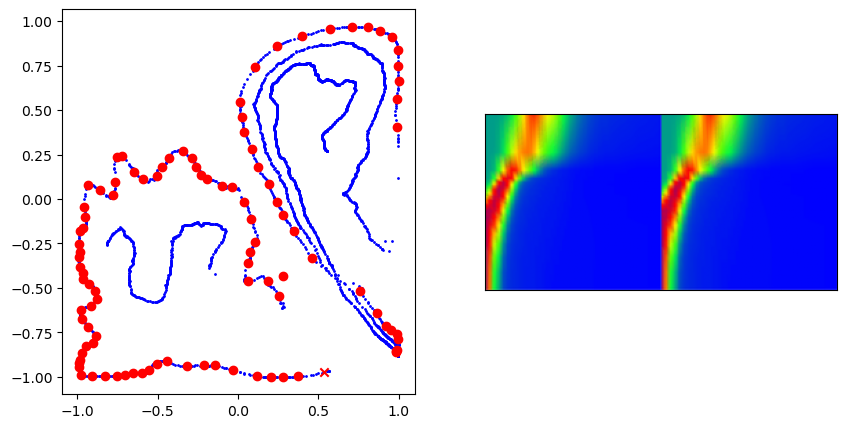

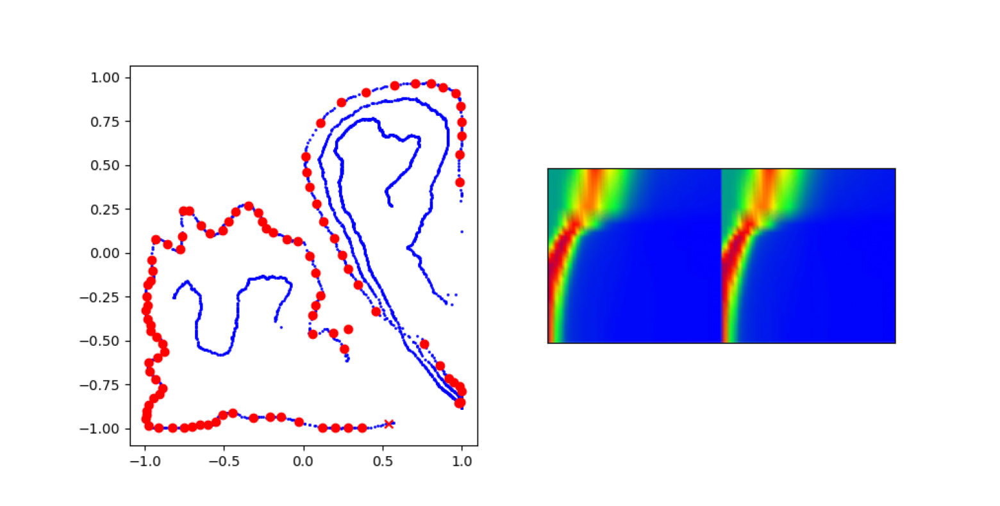

Creation des images

Creation du gif


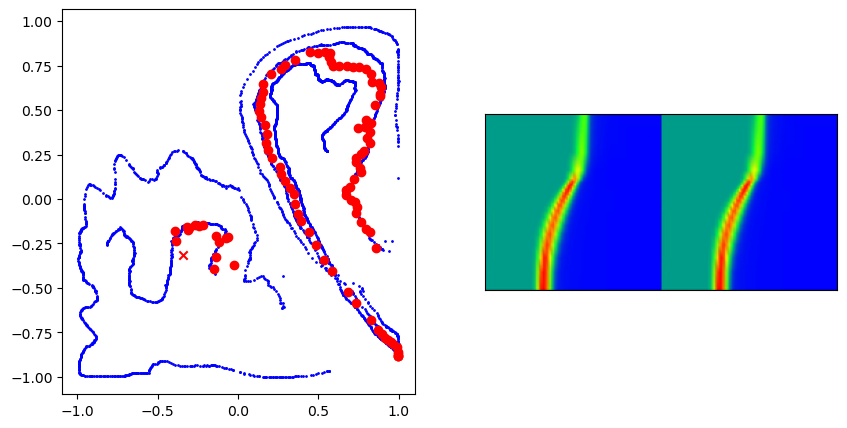

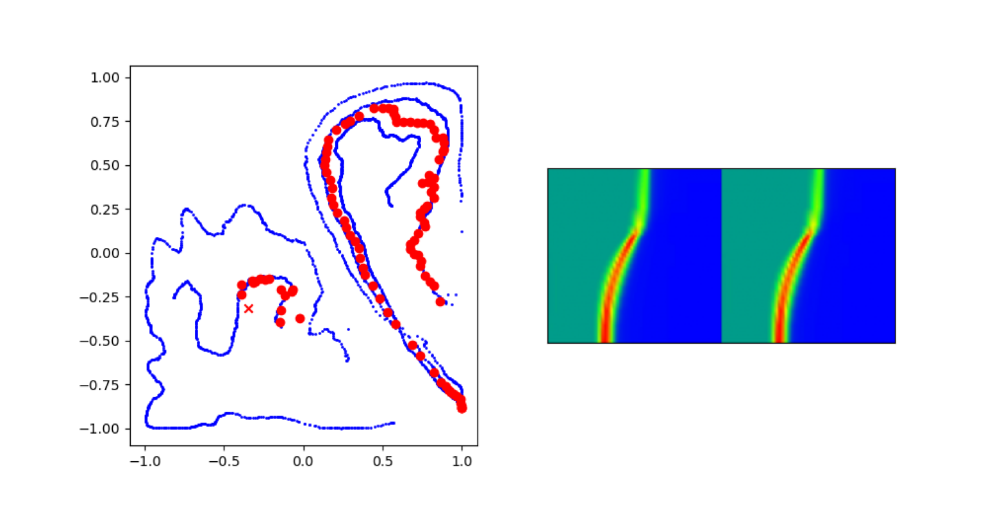

Creation des images

Creation du gif


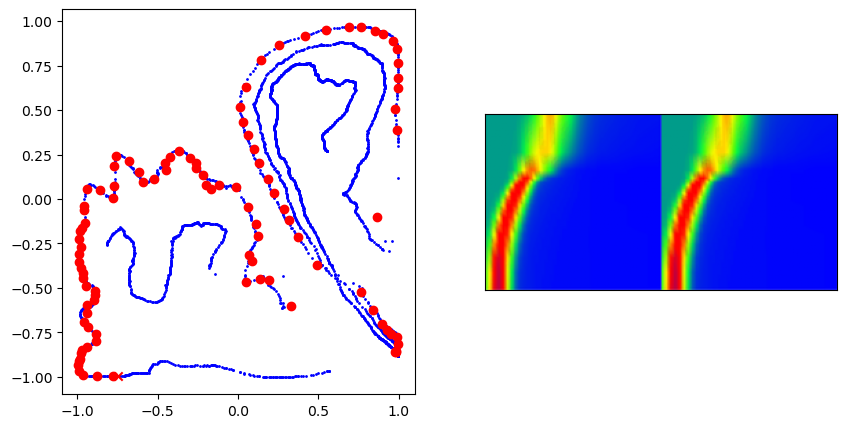

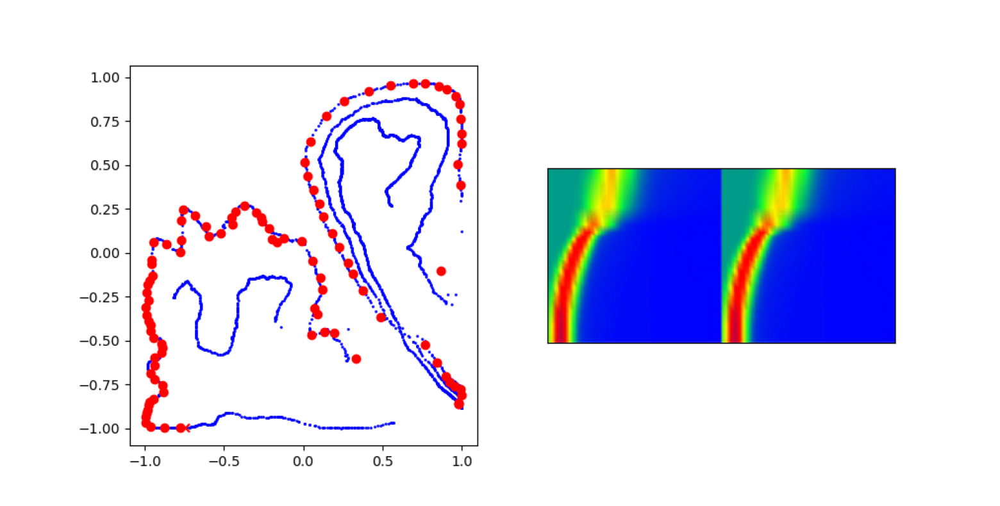

In [86]:
#Creation de tous les gifs pour les différentes animations
JE_VEUX_GIF=True
Bdd_test_2=autoencoder.encoder(Bdd_test).numpy()
Bdd_train_2=autoencoder.encoder(Bdd_train).numpy()
for n in range(0,5):    
    Bdd=Testing[n]
    Test_0=np.array(autoencoder.encoder(Bdd))
    create_images_parcours_AE2(Bdd,Test_0,Bdd_train_2,Bdd_test_2,False,False)
    if JE_VEUX_GIF==True:
        create_gif("../Images/",len(Bdd),str(n))

#### PREDICTION A LONG TERME

In [101]:
#Generation de la base de données et concaténation.
#ATTENTION dans mon fichier d'image l'intensité 0 commence à 1000 au lieu de 0 d'où le if
nom_fichier="hydro"
n=1000
size=128
Bdd_train=[]
prediction_train=[]

Bdd_test=[]
prediction_test=[]
k=0
Nombre_images_voulues=5000
Nombre_fichiers=int(n/57)
indice_train=int(Nombre_fichiers*0.8)
indice_test=n


for i in range(0,3):
    folder=i
    if i==0:
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1003,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1004,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Bdd_train.append(np.concatenate((image1,image2),axis=1))
        
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1004,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)

        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1005,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Bdd_train.append(np.concatenate((image1,image2),axis=1))
        
        for j in range(1005,2001):
            image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j,4)+".gif").convert('RGB')
            image1=image1.resize((128,128),Image.ANTIALIAS)
            image1=np.array(image1)
            image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j+1,4)+".gif").convert('RGB')
            image2=image2.resize((128,128),Image.ANTIALIAS)
            image2=np.array(image2)
            Bdd_train.append(np.concatenate((image1,image2),axis=1))
            prediction_train.append(Bdd_train[len(Bdd_train)-1])
            
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2001,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2002,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        prediction_train.append(np.concatenate((image1,image2),axis=1))   
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2002,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2003,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        prediction_train.append(np.concatenate((image1,image2),axis=1))

    else:
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Bdd_train.append(np.concatenate((image1,image2),axis=1))
        
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(2,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)

        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(3,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        Bdd_train.append(np.concatenate((image1,image2),axis=1))
        
        for j in range(3,999):
            image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j,4)+".gif").convert('RGB')
            image1=image1.resize((128,128),Image.ANTIALIAS)
            image1=np.array(image1)
            image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(j+1,4)+".gif").convert('RGB')
            image2=image2.resize((128,128),Image.ANTIALIAS)
            image2=np.array(image2)
            Bdd_train.append(np.concatenate((image1,image2),axis=1))
            prediction_train.append(Bdd_train[len(Bdd_train)-1])
            
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(999,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1000,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        prediction_train.append(np.concatenate((image1,image2),axis=1))   
        image1=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1000,4)+".gif").convert('RGB')
        image1=image1.resize((128,128),Image.ANTIALIAS)
        image1=np.array(image1)
        image2=Image.open("../Datasets/"+nom_fichier+"/"+str(folder)+"/ima_"+format_number(1001,4)+".gif").convert('RGB')
        image2=image2.resize((128,128),Image.ANTIALIAS)
        image2=np.array(image2)
        prediction_train.append(np.concatenate((image1,image2),axis=1))

print("train fait")
  
k=0



/tmp/ipykernel_9208/3334471647.py:22: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image1=image1.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_9208/3334471647.py:25: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image2=image2.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_9208/3334471647.py:30: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image1=image1.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_9208/3334471647.py:34: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image2=image2.resize((128,128),Image.ANTIALIAS)
/tmp/ipykernel_9208/3334471647.py:40: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 

train fait


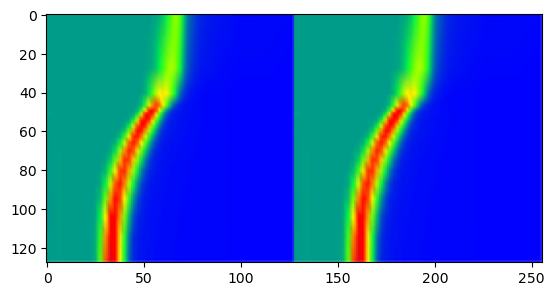

In [64]:
plt.imshow(Bdd_train[1995])

In [71]:
a=[1,2,3,4,5,6,7]
a[::10]

[1]

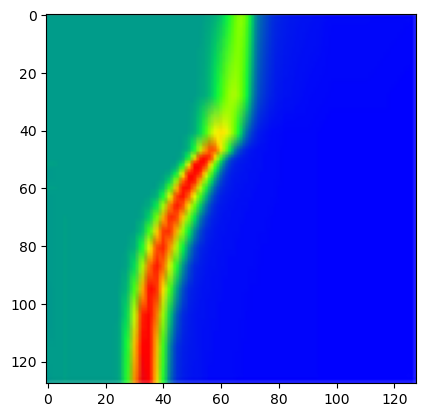

In [102]:
#Ground Truth
fig = plt.figure()
ims = []
IMS1=[]
separate_test=np.array([np.split(Bdd_train[i],2,axis=1) for i in range(998,1996,10)])
for i in range(len(separate_test)):
    im = plt.imshow(separate_test[i,0], animated=True)
    ims.append([im])
    IMS1.append([separate_test[i,0]])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=10000)

ani.save('../Animation/ground_truth/dynamic_images.gif')

plt.show()

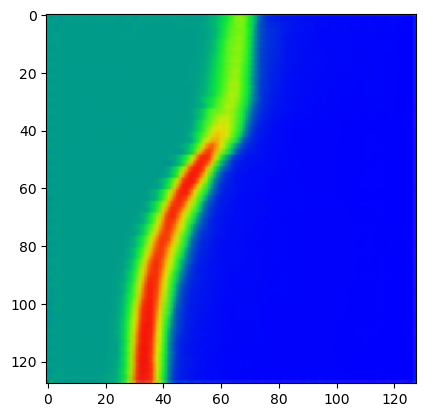

In [107]:
#Proche en proche 
fig = plt.figure()
ims2 = []
IMS_PEP=[]
itera=57
e1=autoencoder.encoder(Bdd_train[998:1996:10]).numpy()
decoded_finale=autoencoder.decoder(e1)
split=np.split(Bdd_train[998],2,axis=1)
im=plt.imshow(split[0],animated=True)
ims2.append([im])
IMS_PEP.append([split[0]])
im=plt.imshow(split[1],animated=True)
ims2.append([im])
IMS_PEP.append([split[1]])

taillade=len(e1)      
for i in range(len(e1)):
    split=np.split(decoded_finale[i],2,axis=1)
    im=plt.imshow(split[0],animated=True)
    ims2.append([im])
    IMS_PEP.append([split[1]])
    


ani = animation.ArtistAnimation(fig, ims2, interval=50, blit=True,
                                repeat_delay=1000)

ani.save('../Animation/PeP/dynamic_images.gif')

plt.show()

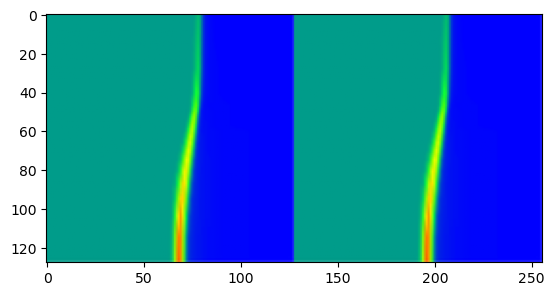

In [84]:
plt.imshow(Bdd_train[1300])

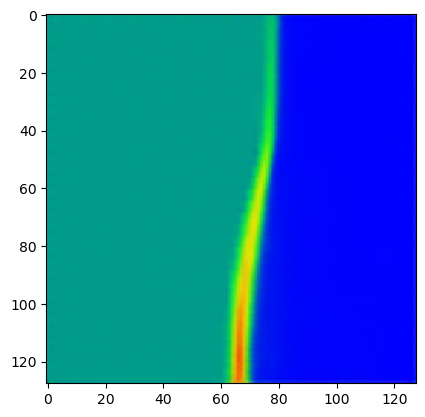

In [85]:
#AE1 ligne 1

fig = plt.figure()
ims = []
itera=57

decoded_finale=Bdd_train[998:999]
for i in range(taillade*10):
    if i%10==0:
        split=np.split(decoded_finale[0],2,axis=1)
        im=plt.imshow(split[0],animated=True)
        ims.append([im])
    #im=plt.imshow(split[1],animated=True)
    #ims.append([im])
    e1=autoencoder.encoder(decoded_finale).numpy()
    #oui=Normalisation_bdd(e1)
    #e2=autoencoder_2.encoder_2(oui).numpy()
    #e3=Denormalisation_bdd(autoencoder_2.decoder_2(e2).numpy(),e1)
    decoded_finale=autoencoder.decoder(e1)
    
    
ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

ani.save('../Animation/AE1/dynamic_images.gif')
    

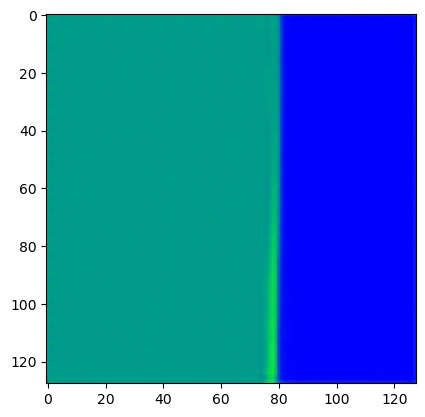

In [108]:
#Stabilisation

fig = plt.figure()
ims = []
itera=57
Vector=[]
decoded_finale=Bdd_train[998:999]
for i in range(taillade*10):
    if i%10==0:
        split=np.split(decoded_finale[0],2,axis=1)
        im=plt.imshow(split[0],animated=True)
        ims.append([im])

    e1=autoencoder.encoder(decoded_finale).numpy()
    e2=autoencoder_2.encoder_2(e1).numpy()
    Vector.append(e2[0])
    e3=autoencoder_2.decoder_2(e2).numpy()
    decoded_finale=autoencoder.decoder(e1)
    
    
ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)



ani.save('../Animation/stabilisation/dynamic_images.gif')
    

In [98]:
Vector.shape

(1000, 1, 1, 2)